Une association locale de protection des animaux souhaite une API capable de détecter la race des chiens à partir de leurs images. En tant que bénévoles, nous proposons de développer un algorithme de reconnaissance d'image pour faciliter l'indexation de leur base de données. En utilisant la base de données Stanford Dogs Dataset car les images de leurs pensionnaires ne sont pas encore rassemblées. L'objectif de ce projet est d'expliquer comment mettre en place un algorithme de détection de la race du chien sur une image pour accélérer le processus d'indexation.

Points importants du projet :

- Prétraitement des images (par exemple, blanchiment, égalisation, débruitage).
- Mise en œuvre de la data augmentation.
- Deux approches d'utilisation de CNN :
  1- Création d'un réseau de neurones CNN à partir de zéro en optimisant les paramètres.
  2- Utilisation du transfert learning et comparaison avec des réseaux déjà entraînés.
  
Le modèle final choisi et entraîné est enregistré sous le nom : "Saved_model/fine_tune_efficientnetb3.h5". Le répertoire contient également une permutation des races encodées par Keras lors de l'entraînement.

## <font color="#ea1c60">Sommaire</font>  
[I. Importation et Prétraitement des Images](#section_1)

[II. Création d'un Modèle de Classification CNN à Partir de Zéro](#section_2)

[III. Application du Transfert Learning en exploitation un Modèle CNN Pré-entraîné ](#section_3)

[IV. Développement du Modèle Final sur l'Ensemble de Données Complet](#section_4)

In [205]:
# import  python librairies
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from PIL import Image
import joblib
import cv2
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix

In [206]:
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras import backend as K
import tensorflow as tf
from keras.utils.vis_utils import plot_model
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense
from keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.resnet50 import ResNet50
from keras.applications.xception import Xception
from tensorflow.keras.applications.efficientnet import EfficientNetB3

In [3]:
device_name = tf.test.gpu_device_name()
if "GPU" not in device_name:
    print("GPU device not found")
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


### <font id="section_1">I. Chargement et preprocessing des images

Pour démarrer, nous procéderons à une analyse rapide des données de Stanford Dogs Dataset afin d'examiner la répartition des images selon les races de chiens

In [4]:
"""
%%time
# Importation de la bibliothèque tarfile pour gérer les fichiers TAR
import tarfile

# Ouverture de l'archive "images.tar" en mode lecture
archive = tarfile.open("/content/drive/MyDrive//Colab Notebooks/Ingenieur IA/Mission_5 Classer_image_deep Learning/images.tar")

# Extraction de tous les fichiers contenus dans l'archive vers le répertoire courant
archive.extractall(path="/content/drive/MyDrive//Colab Notebooks/Ingenieur IA/Mission_5 Classer_image_deep Learning")

# Fermeture de l'archive après l'extraction
archive.close()
"""

'\n%%time\n# Importation de la bibliothèque tarfile pour gérer les fichiers TAR\nimport tarfile\n\n# Ouverture de l\'archive "images.tar" en mode lecture\narchive = tarfile.open("/content/drive/MyDrive//Colab Notebooks/Ingenieur IA/Mission_5 Classer_image_deep Learning/images.tar")\n\n# Extraction de tous les fichiers contenus dans l\'archive vers le répertoire courant\narchive.extractall(path="/content/drive/MyDrive//Colab Notebooks/Ingenieur IA/Mission_5 Classer_image_deep Learning")\n\n# Fermeture de l\'archive après l\'extraction\narchive.close()\n'

In [5]:
# Chemin du répertoire contenant les images des races de chiens
path = "Images"

# Liste des noms de races de chiens (nom de chaque sous-répertoire)
race_chien = os.listdir(path)

# Extraction du mot après le trait d'union pour chaque nom de race
race_names = [race.split("-")[1] if "-" in race else race for race in race_chien]

# Création d'un DataFrame à partir de la liste des noms de races
data = {"Race": race_names}
df1 = pd.DataFrame(data)

# Affichage du DataFrame
df1


,Race
0,Chihuahua
1,Japanese_spaniel
2,Maltese_dog
3,Pekinese
4,Shih
...,...
115,standard_poodle
116,Mexican_hairless
117,dingo
118,dhole


Nous disposons d'une base de données comprenant 120 races de chiens distinctes, ce qui signifie que notre modèle de deep learning comportera 120 classes à classifier.

In [6]:
import pandas as pd

# Création d'un DataFrame avec la liste des races de chiens
df = pd.DataFrame(race_chien, columns=['Id_race'])

# Ajout d'une colonne "race" pour le nom de la race
df['race'] = df['Id_race'].apply(lambda x: x.split('-')[1])

# Ajout d'une colonne "Id" pour l'identifiant de la race
df['Id'] = df['Id_race'].apply(lambda x: x.split('-')[0])

# Calcul du nombre d'images pour chaque race
nb_pic = []
for name in df.Id_race:
    nb_pic.append(len(os.listdir(path + "/" + name)))

# Ajout d'une colonne "nb_pic" pour le nombre d'images
df['nb_image'] = nb_pic

# Affichage du nombre total d'images
print("Le nombre total d'images est :", df["nb_image"].sum())


Le nombre total d'images est : 20580


Nous disposons dans notre base de données de 20 500 photos de chien.

In [7]:
df   #dataframe des 120 races de chiens

,Id_race,race,Id,nb_image
0,n02085620-Chihuahua,Chihuahua,n02085620,152
1,n02085782-Japanese_spaniel,Japanese_spaniel,n02085782,185
2,n02085936-Maltese_dog,Maltese_dog,n02085936,252
3,n02086079-Pekinese,Pekinese,n02086079,149
4,n02086240-Shih-Tzu,Shih,n02086240,214
...,...,...,...,...
115,n02113799-standard_poodle,standard_poodle,n02113799,159
116,n02113978-Mexican_hairless,Mexican_hairless,n02113978,155
117,n02115641-dingo,dingo,n02115641,156
118,n02115913-dhole,dhole,n02115913,150



Nous allons analyser la structure du jeu de données en ce qui concerne la répartition par race

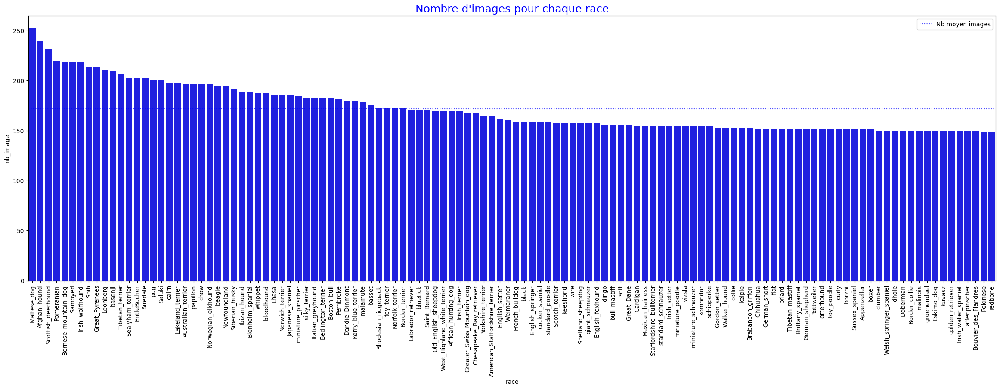

In [8]:
# Supposez que vous ayez déjà préparé votre DataFrame df avec les données nécessaires

# Triez le DataFrame par la colonne 'nb_image' en ordre décroissant
df_sorted = df.sort_values(by='nb_image', ascending=False)

fig, ax = plt.subplots(1, 1, figsize=(29, 8))

sns.barplot(x='race', y='nb_image', data=df_sorted, color='blue', ax=ax)

ax.axhline(df_sorted["nb_image"].mean(),
           color='blue', alpha=.7,
           linestyle=':',
           label="Nb moyen images")

plt.title("Nombre d'images pour chaque race",
          color='blue', fontsize=18)
plt.legend()

# Rotation des étiquettes en position verticale
plt.xticks(rotation=90, ha='center')  # ha='center' aligne les étiquettes au centre

plt.show()


Le jeu de données présente une répartition assez équilibrée en termes du nombre de photos pour chaque race.

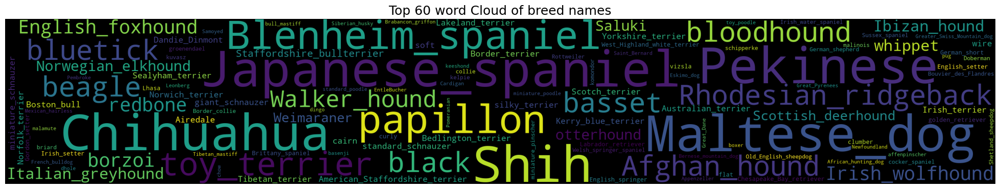

In [9]:
from wordcloud import WordCloud
fig = plt.figure(1, figsize=(25, 5))
ax = fig.add_subplot(1, 1, 1)
wordcloud = WordCloud(width=3000, height=500,
                      background_color="black",max_words=200, relative_scaling=1,
                      normalize_plurals=False).generate(" ".join(df.race))

ax.imshow(wordcloud)
ax.axis("off")
plt.title("Top 60 word Cloud of breed names", fontsize=18)
plt.show()

In [10]:
%%time
# Chemin vers le dossier contenant les images de chiens
base_folder = "Images"

# Liste pour stocker les données
data = []

# Parcourir les sous-dossiers
for breed_folder_name in os.listdir(base_folder):
    breed_folder_path = os.path.join(base_folder, breed_folder_name)
    if os.path.isdir(breed_folder_path):
        for image_name in os.listdir(breed_folder_path):
            image_path = os.path.join(breed_folder_path, image_name)
            if image_name.endswith(('.jpg', '.png', '.jpeg')):
                with Image.open(image_path) as img:
                    width, height = img.size
                    color_channels = img.getbands()
                    breed_name = breed_folder_name.split('-')[1]  # Get the breed name from folder name
                    data.append({
                        "heigth": height,
                        "width": width,
                        "color": len(color_channels),
                        "breed_name": breed_name,
                        "image_path": image_path
                    })

# Création ldu DataFrame
image_detail= pd.DataFrame(data)

CPU times: total: 250 ms
Wall time: 7.77 s


In [11]:
image_detail

,heigth,width,color,breed_name,image_path
0,500,333,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10074.jpg
1,495,395,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10131.jpg
2,298,500,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10621.jpg
3,500,345,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_1073.jpg
4,484,322,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10976.jpg
...,...,...,...,...,...
20575,375,500,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20576,333,500,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20577,300,202,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20578,400,600,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...


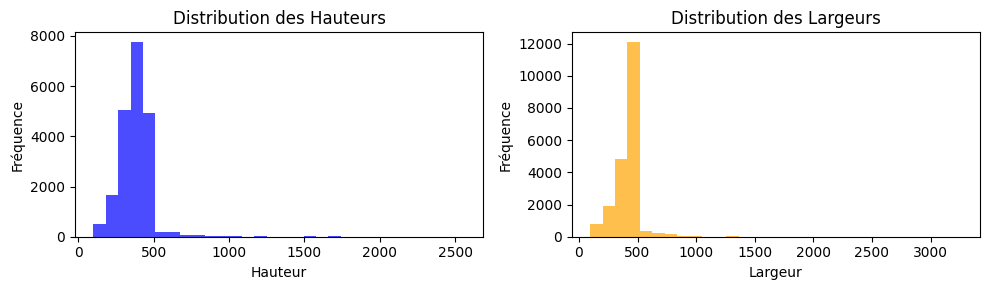

In [12]:
# Création une figure avec deux sous-graphiques côte à côte
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

# Création du graphique pour la distribution des hauteurs
ax1.hist(image_detail['heigth'], bins=30, color='blue', alpha=0.7)
ax1.set_xlabel('Hauteur')
ax1.set_ylabel('Fréquence')
ax1.set_title('Distribution des Hauteurs')

# Création du graphique pour la distribution des largeurs
ax2.hist(image_detail['width'], bins=30, color='orange', alpha=0.7)
ax2.set_xlabel('Largeur')
ax2.set_ylabel('Fréquence')
ax2.set_title('Distribution des Largeurs')

# Ajustement de l'espace entre les graphiques
plt.tight_layout()

# Affichage des graphiques
plt.show()

In [13]:
image_detail['color'].value_counts()

color
3    20579
4        1
Name: count, dtype: int64

In [14]:
image_detail

,heigth,width,color,breed_name,image_path
0,500,333,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10074.jpg
1,495,395,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10131.jpg
2,298,500,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10621.jpg
3,500,345,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_1073.jpg
4,484,322,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10976.jpg
...,...,...,...,...,...
20575,375,500,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20576,333,500,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20577,300,202,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20578,400,600,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...


In [15]:
image_detail=image_detail[image_detail.color!=4]  # On supprime la seule image qui a 4  canaux de couleurs 
image_detail

,heigth,width,color,breed_name,image_path
0,500,333,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10074.jpg
1,495,395,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10131.jpg
2,298,500,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10621.jpg
3,500,345,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_1073.jpg
4,484,322,3,Chihuahua,Images\n02085620-Chihuahua\n02085620_10976.jpg
...,...,...,...,...,...
20575,375,500,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20576,333,500,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20577,300,202,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...
20578,400,600,3,African_hunting_dog,Images\n02116738-African_hunting_dog\n02116738...


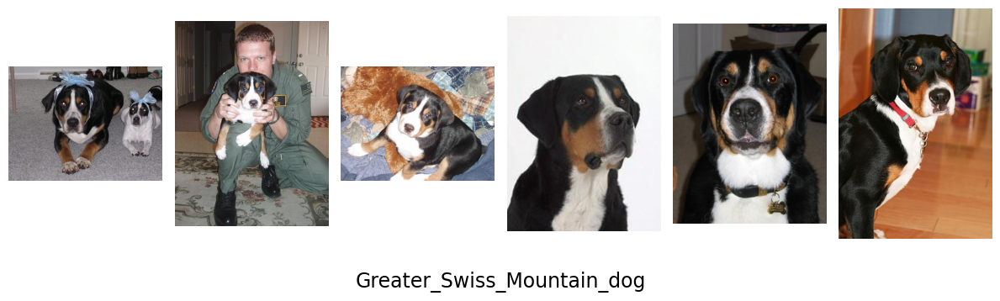

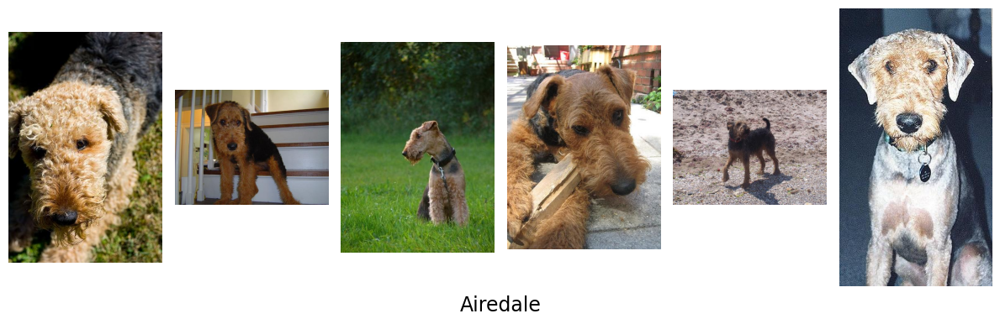

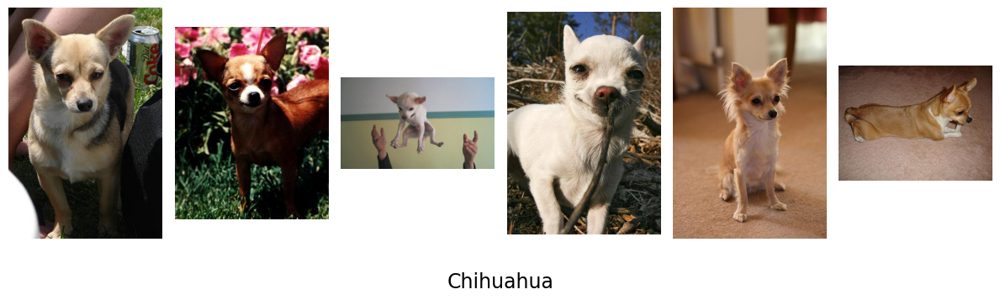

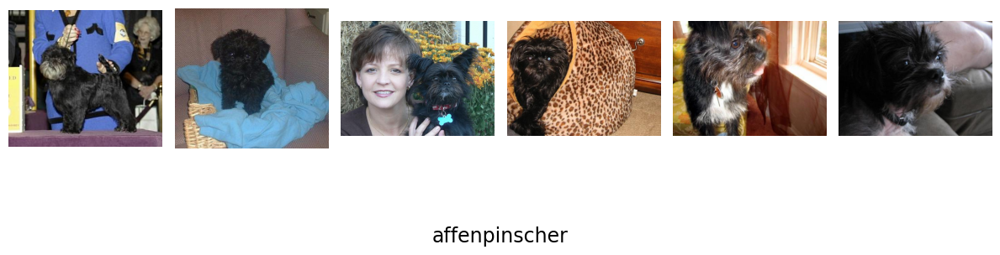

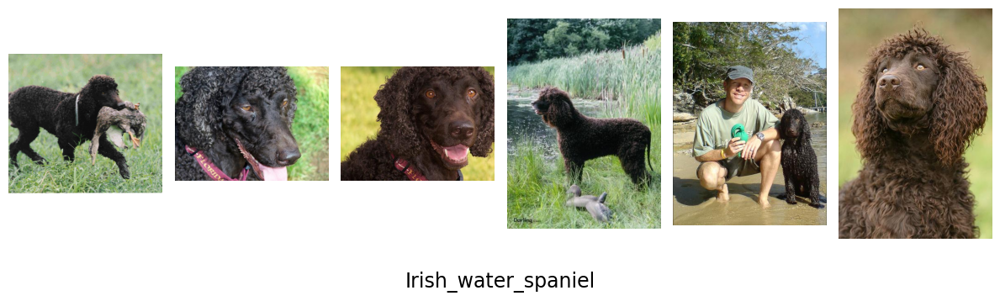

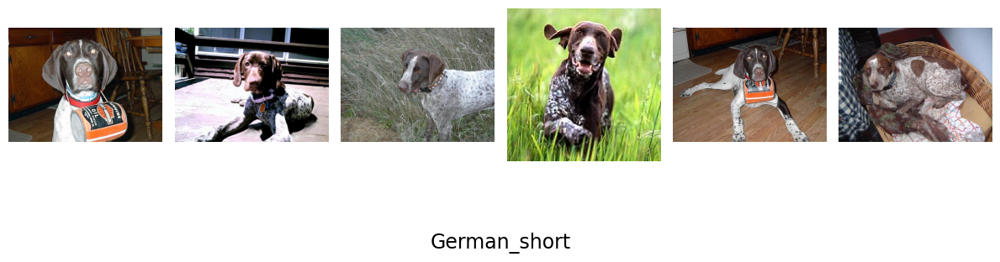

In [16]:
Num = 6
breed_id_sample = np.random.choice(df['Id_race'].values, Num)

for classe in breed_id_sample:
    images = os.listdir(os.path.join(path, classe))[:Num]
    fig, axes = plt.subplots(1, Num, figsize=(12, 4))
    plt.suptitle("{}".format(classe.split("-")[1]), y=0.01, color="black", fontsize=17)

    for i, ax in enumerate(axes):
        img = mpimg.imread(os.path.join(path, classe, images[i]))
        ax.imshow(img)
        ax.axis('off')

    plt.tight_layout()
    plt.show()

Depuis les exemples ci-dessus, nous observons que les dimensions des images varient. Il est important de noter que les modèles CNN nécessitent une taille uniforme pour toutes les données. Par conséquent, nous avons décidé de redimensionner toutes les images à une dimension commune (300, 300). Cette adaptation garantit leur compatibilité avec la résolution maximale requise par un réseau pré-entraîné EfficientNetB3, tel que mentionné dans la section sur le transfert d'apprentissage.

Nous allons donc entreprendre un ensemble de transformations sur notre ensemble d'images. Cela inclut le redimensionnement, l'égalisation, le débruitage et le blanchiment.

### <font id="section_12"> I.2 Transformation des images

##### I.2.1 Egalisation d'histogramme

L'égalisation d'image en traitement d'images ajuste la répartition des niveaux de gris ou de couleurs pour améliorer le contraste et la lisibilité. Elle vise à uniformiser la luminosité, rendant les détails plus visibles. Dans notre  approche nous allons utiliser OpenCV pour réaliser l'égalisation et améliorer le contraste en répartissant uniformément l'intensité lumineuse sur l'image.

Puisque nos images sont en RGB, nous allons appliquer le processus d'égalisation à chaque canal de couleur (Rouge, Vert et Bleu). Cela produira trois histogrammes superposés, chacun correspondant à un canal de couleur.

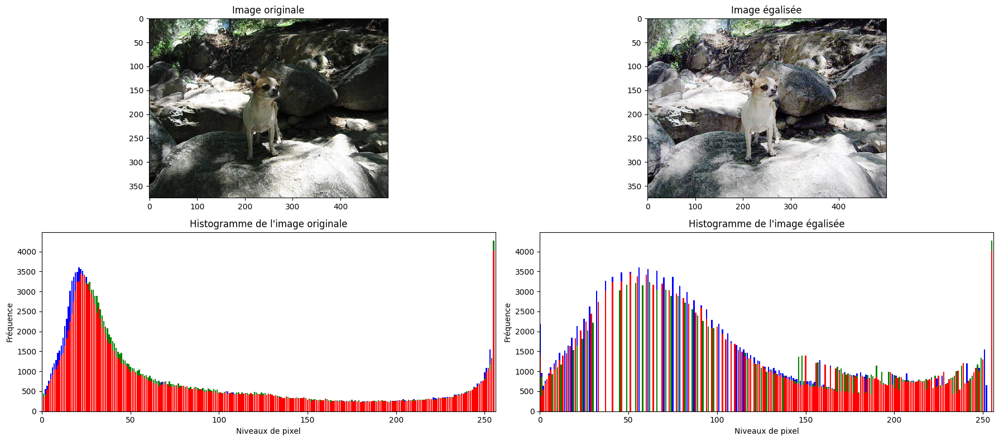

In [17]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

uri = image_detail.index[np.random.randint(0, 1000)]

# Remplacez 'image_detail' par le nom approprié de votre dataframe ou variable
image_path = image_detail.loc[uri, 'image_path']

# Charger l'image
image = cv2.imread(image_path)

# Égalisation des canaux RGB
r_image, g_image, b_image = cv2.split(image)
r_image_eq = cv2.equalizeHist(r_image)
g_image_eq = cv2.equalizeHist(g_image)
b_image_eq = cv2.equalizeHist(b_image)
image_eq = cv2.merge((r_image_eq, g_image_eq, b_image_eq))

# Afficher les images et leurs histogrammes côte à côte
fig, axes = plt.subplots(2, 2, figsize=(18, 8))

# Afficher l'image originale
axes[0, 0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0, 0].set_title("Image originale")

# Afficher l'histogramme de l'image originale
color = ('b', 'g', 'r')
for i, col in enumerate(color):
    hist = cv2.calcHist([image], [i], None, [256], [0, 256])
    axes[1, 0].bar(range(256), hist[:, 0], color=col)
    axes[1, 0].set_xlim([0, 256])
axes[1, 0].set_title("Histogramme de l'image originale")
axes[1, 0].set_xlabel("Niveaux de pixel")
axes[1, 0].set_ylabel("Fréquence")

# Afficher l'image égalisée
axes[0, 1].imshow(cv2.cvtColor(image_eq, cv2.COLOR_BGR2RGB))
axes[0, 1].set_title("Image égalisée")

# Afficher l'histogramme de l'image égalisée
for i, col in enumerate(color):
    hist_eq = cv2.calcHist([image_eq], [i], None, [256], [0, 256])
    axes[1, 1].bar(range(256), hist_eq[:, 0], color=col)
    axes[1, 1].set_xlim([0, 256])
axes[1, 1].set_title("Histogramme de l'image égalisée")
axes[1, 1].set_xlabel("Niveaux de pixel")
axes[1, 1].set_ylabel("Fréquence")

plt.tight_layout()
plt.show()



### I.2.2 Débruitage de l'image

Le **bruit** dans une image est semblable à un "parasite" visuel qui peut rendre l'image moins nette, introduire des taches, des grains, des changements de couleur ou des artefacts. Le processus de débruitage consiste à éliminer ou à réduire ces variations indésirables pour améliorer la qualité de l'image et permettre aux algorithmes, comme les réseaux de neurones, de mieux interpréter les informations visuelles.

En traitement d'images, un filtre est une opération mathématique appliquée à une image pour modifier ses caractéristiques. Les filtres sont utilisés pour des tâches comme le débruitage, la détection de contours, la modification des couleurs, etc. Ils transforment chaque pixel en fonction de ses valeurs et de ses voisins, améliorant ainsi la qualité et la détection de caractéristiques dans l'image. En somme, les filtres sont essentiels pour manipuler et améliorer les images en appliquant diverses transformations aux pixels.


**Le processus de débruitage d'une image consiste à utiliser des filtres afin de diminuer les variations indésirables dans l'image.**


Il existe plusieurs filtres utilisés pour débruiter une image. Voici quelques-uns des filtres couramment employés à cette fin :

1. **Filtre Gaussien** : Il lisse l'image en utilisant une distribution gaussienne, réduisant ainsi le bruit. Cependant, il peut aussi estomper les détails fins.

2. **Filtre Médian** : Il remplace la valeur de chaque pixel par la médiane de ses voisins. Efficace pour éliminer le bruit impulsionnel (salt-and-pepper) sans lisser excessivement.

3. **Filtre Bilatéral**: Préserve les contours tout en réduisant le bruit en fonction des similitudes de couleur et de distance.

4. **Filtre Non-Local Means** : Utilise la similarité globale entre les pixels pour calculer une moyenne pondérée, préservant les détails tout en éliminant le bruit.

Chaque filtre a ses propres avantages et limitations en fonction du type de bruit et des caractéristiques de l'image. Le choix du filtre dépendra donc de la nature spécifique du bruit et des résultats souhaités.

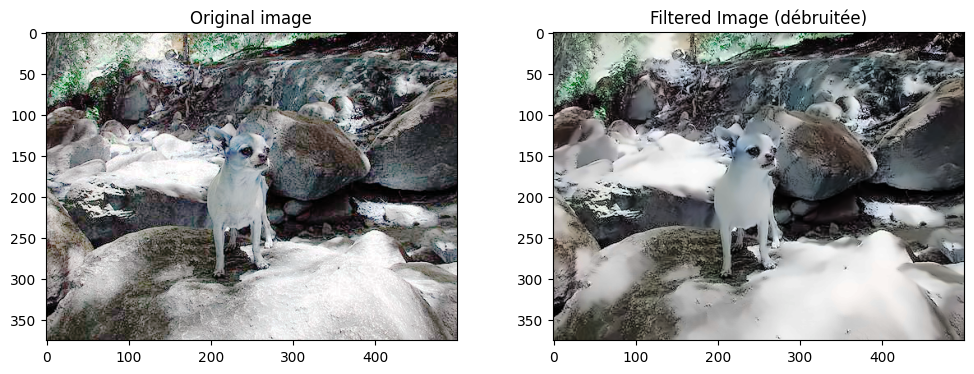

In [18]:
# Apply non-local means filter on test img
img_nlf = cv2.fastNlMeansDenoisingColored(image_eq,None,10,10,7,21)
# Show both img
fig = plt.figure(figsize=(12,4))
plt.subplot(1, 2, 1)
plt.imshow(image_eq)
plt.title("Original image")
plt.subplot(1, 2, 2)
plt.imshow(img_nlf)
plt.title("Filtered Image (débruitée)")
plt.show()

### I.2.3 Whitening d'image

Le whitening est une technique de prétraitement utilisée dans le domaine du traitement d'images et de l'apprentissage automatique. Son objectif principal est de décorréler les variables (ou les caractéristiques) et de normaliser leurs variances. Le but de cette opération est de simplifier l'analyse et d'améliorer les performances des algorithmes d'apprentissage automatique.

Le whitening est particulièrement utile pour plusieurs raisons :

1. **Réduction de la redondance** : Les pixels voisins dans une image peuvent être fortement corrélés en raison de la cohérence spatiale des objets. En décorrélation les valeurs des pixels, le whitening permet de réduire cette redondance, ce qui peut améliorer les performances des modèles d'apprentissage.

2. Facilitation de l'apprentissage : Dans de nombreux cas, les algorithmes d'apprentissage automatique, tels que les réseaux de neurones, fonctionnent mieux lorsque les caractéristiques sont plus indépendantes. Le whitening peut contribuer à cette indépendance, ce qui peut rendre l'apprentissage plus rapide et plus efficace.

3. Normalisation des variances : En ajustant les variances des différentes caractéristiques, le whitening peut éviter que certaines caractéristiques dominantes ne submergent les autres lors de l'apprentissage.


In [19]:
def zca_whitening(image, eps):
    """Fonction qui calcule la transformation de blanchiment ZCA d'une image couleur
    --------------------
    param :
    image : image à traiter
    eps : seuil de blanchiment <1
    """

    # Suppression de la moyenne de chaque pixel
    image_c = image - image.mean(axis=0)

    # Séparation de l'image_c en 3 canaux de couleur
    r_image, g_image, b_image = cv2.split(image_c)

    # Calcul de la matrice de covariance des données centrées
    cov_r = np.cov(r_image, rowvar=False, bias=True)
    cov_g = np.cov(g_image, rowvar=False, bias=True)
    cov_b = np.cov(b_image, rowvar=False, bias=True)

    # Calcul de la décomposition en valeurs singulières (SVD) des matrices de covariance
    U_r, S_r, V_r = np.linalg.svd(cov_r)
    U_g, S_g, V_g = np.linalg.svd(cov_g)
    U_b, S_b, V_b = np.linalg.svd(cov_b)

    # Transformation de whitening en utilisant ZCA (Zero Component Analysis)
    r_img_zca = U_r.dot(np.diag(1.0 / np.sqrt(S_r + eps))).dot(U_r.T).dot(r_image.T).T
    g_img_zca = U_g.dot(np.diag(1.0 / np.sqrt(S_g + eps))).dot(U_g.T).dot(g_image.T).T
    b_img_zca = U_b.dot(np.diag(1.0 / np.sqrt(S_b + eps))).dot(U_b.T).dot(b_image.T).T

    # Recomposition de l'image
    img_zca = cv2.merge((r_img_zca, g_img_zca, b_img_zca)) + image.mean(axis=0) / 255

    return img_zca


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


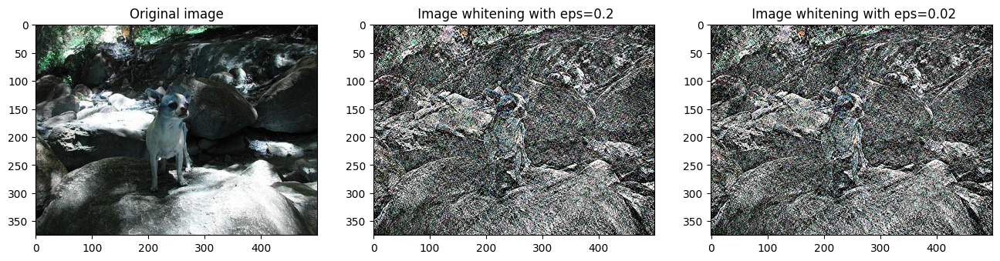

In [20]:
image = cv2.imread(image_path)
x_1 = zca_whitening(image,0.2)
x_2 = zca_whitening(image, 0.02)
fig = plt.figure(figsize=(16,5))
plt.subplot(1, 3, 1)
plt.imshow(image)
plt.title("Original image")
plt.subplot(1, 3, 2)
plt.imshow(x_1)
plt.title(" Image whitening with eps=0.2")
plt.subplot(1, 3, 3)
plt.imshow(x_2)
plt.title(" Image whitening with eps=0.02")
plt.show()

### I.2.4 Augmentation de données

La data augmentation est une technique d'apprentissage automatique, souvent utilisée pour les images, qui consiste à appliquer des transformations aléatoires et contrôlées aux exemples d'entraînement existants. Son objectif est d'augmenter la quantité et la diversité des données disponibles pour l'entraînement des modèles. Cela aide à améliorer la généralisation du modèle, à le rendre plus robuste face aux variations et aux perturbations, et à prévenir le surapprentissage. Les transformations incluent la **translation**, la **rotation**, le **miroir horizontal**, le **zoom**, la modification de la luminosité, l'ajout de bruit, le cadrage aléatoire et le changement de couleur.

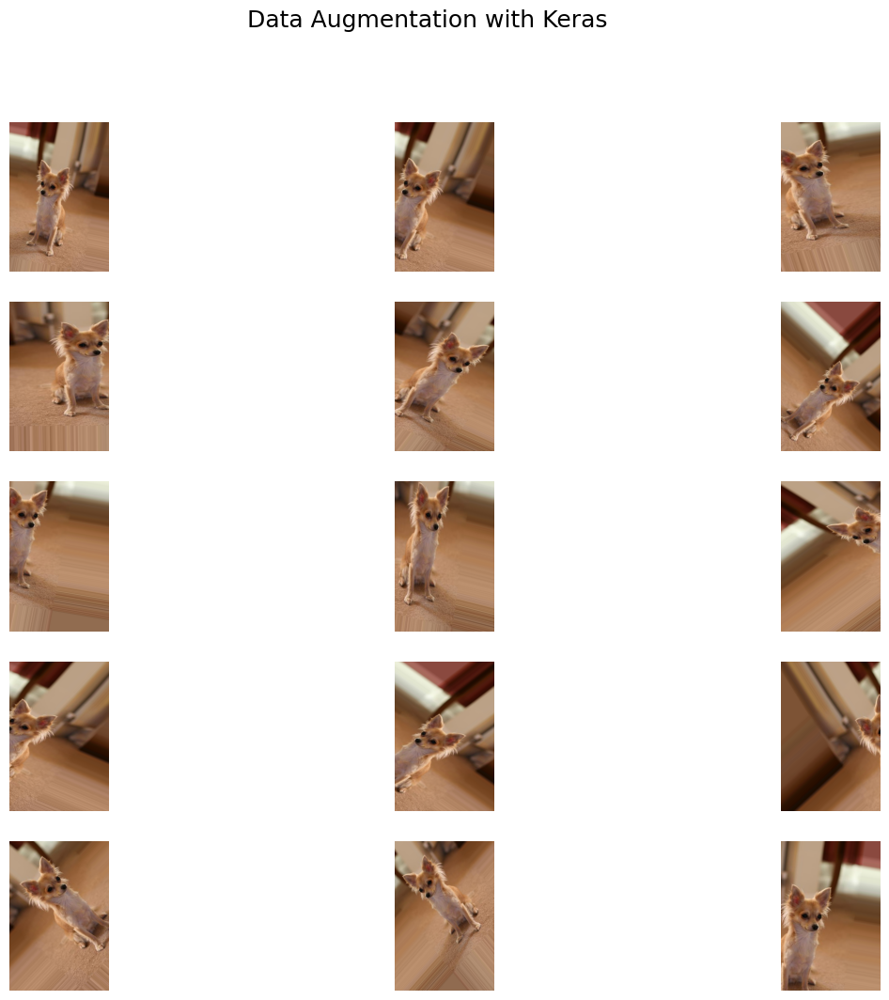

CPU times: total: 703 ms
Wall time: 812 ms


In [21]:
%%time
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

datagen = ImageDataGenerator(
    rotation_range=50,
    width_shift_range=0.25,
    height_shift_range=0.25,
    rescale=1.0/255,
    shear_range=0.25,
    zoom_range=0.25,
    horizontal_flip=True,
    fill_mode='nearest')

# Charger une image à l'aide de matplotlib.image.imread
x = mpimg.imread(image_detail.loc[4, 'image_path'])
x = x.reshape((1,) + x.shape)

# Afficher les images augmentées
plt.figure(figsize=(15, 12))
for i in range(15):  # Limiter à 15 images augmentées
    batch = next(datagen.flow(x, batch_size=1))
    image = array_to_img(batch[0])

    plt.subplot(5, 3, i+1)
    plt.imshow(image)
    plt.axis('off')

plt.suptitle("Data Augmentation with Keras", fontsize=18)
plt.show()


Preprocessing des données avant alimentation du réseaux de neurones CNN

In [22]:
def preprocessing(uri_list, input_shape):
    """Prétraitement des images pour un réseau de neurones convolutifs.
    Égalisation, débruitage et transformation de l'image en tableau.
    ------------------
    param :
    uri_list : liste des répertoires d'images
    input_shape : taille (largeur, hauteur) de l'image pour le redimensionnement cible
    """
    img_list = []
    for uri in uri_list:
        # Lire l'image
        image = cv2.imread(uri)
        # Redimensionner l'image
        image = cv2.resize(image, input_shape)
        # Égalisation
        r_image, g_image, b_image = cv2.split(image)
        r_image_eq = cv2.equalizeHist(r_image)
        g_image_eq = cv2.equalizeHist(g_image)
        b_image_eq = cv2.equalizeHist(b_image)
        image_eq = cv2.merge((r_image_eq, g_image_eq, b_image_eq))
        # Appliquer le filtre non-local means
        img_nlf = cv2.fastNlMeansDenoisingColored(image_eq, None, 10, 10, 7, 21)

        # Ajouter les images à la liste
        img_list.append(img_nlf)

    return np.array(img_list)

Nous allons créer et entraîner des modèles en utilisant les cinq premières races de chiens les plus fréquentes dans notre dataset. Si les résultats s'avèrent satisfaisants, nous pourrons envisager d'étendre l'application de l'algorithme à l'ensemble des races de chiens.

In [23]:
df_sorted.head(5)

,Id_race,race,Id,nb_image
2,n02085936-Maltese_dog,Maltese_dog,n02085936,252
9,n02088094-Afghan_hound,Afghan_hound,n02088094,239
26,n02092002-Scottish_deerhound,Scottish_deerhound,n02092002,232
107,n02112018-Pomeranian,Pomeranian,n02112018,219
88,n02107683-Bernese_mountain_dog,Bernese_mountain_dog,n02107683,218


In [24]:
fr_breed_list = df_sorted.nlargest(5,'nb_image')['race'] # Liste des 5 races les plus célèbres de France
fr_breed_list

2               Maltese_dog
9              Afghan_hound
26       Scottish_deerhound
107              Pomeranian
88     Bernese_mountain_dog
Name: race, dtype: object

In [25]:
data_cnn=image_detail[image_detail['breed_name'].isin(fr_breed_list)].reset_index()[['image_path','breed_name']]
data_cnn

,image_path,breed_name
0,Images\n02085936-Maltese_dog\n02085936_10073.jpg,Maltese_dog
1,Images\n02085936-Maltese_dog\n02085936_10130.jpg,Maltese_dog
2,Images\n02085936-Maltese_dog\n02085936_10148.jpg,Maltese_dog
3,Images\n02085936-Maltese_dog\n02085936_10197.jpg,Maltese_dog
4,Images\n02085936-Maltese_dog\n02085936_10199.jpg,Maltese_dog
...,...,...
1155,Images\n02112018-Pomeranian\n02112018_938.jpg,Pomeranian
1156,Images\n02112018-Pomeranian\n02112018_9753.jpg,Pomeranian
1157,Images\n02112018-Pomeranian\n02112018_9791.jpg,Pomeranian
1158,Images\n02112018-Pomeranian\n02112018_9861.jpg,Pomeranian


In [26]:
uri_list=data_cnn['image_path'] # liens des différentes photos

label_list=data_cnn['breed_name']

In [27]:
%%time
X = preprocessing(uri_list, (300,300))


CPU times: total: 9min 54s
Wall time: 11min 7s


In [28]:
label_list

0       Maltese_dog
1       Maltese_dog
2       Maltese_dog
3       Maltese_dog
4       Maltese_dog
           ...     
1155     Pomeranian
1156     Pomeranian
1157     Pomeranian
1158     Pomeranian
1159     Pomeranian
Name: breed_name, Length: 1160, dtype: object

In [29]:
joblib.dump(X, "Variables/X", compress=True)
#X=joblib.load("Variables/X")

['Variables/X']

In [30]:
pd.DataFrame(label_list).value_counts()

breed_name          
Maltese_dog             252
Afghan_hound            239
Scottish_deerhound      232
Pomeranian              219
Bernese_mountain_dog    218
Name: count, dtype: int64

In [31]:
%%time
y = label_list
# Convert data in numpy array
y = np.array(y)
#Encode labels
encoder = LabelEncoder()
encoder.fit(y)
y = encoder.transform(y)

print("-" * 60)
print("Number of images preprocessed :", X.shape[0])


------------------------------------------------------------
Number of images preprocessed : 1160
CPU times: total: 0 ns
Wall time: 0 ns


In [32]:
X.shape

(1160, 300, 300, 3)

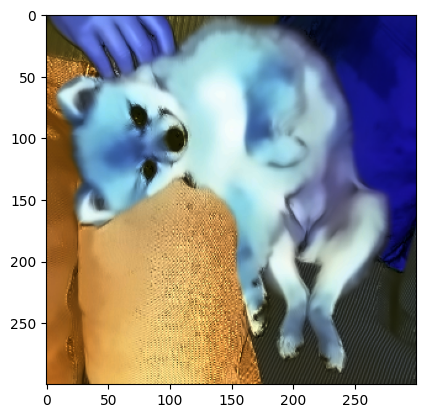

In [33]:
# Show exemple preprocessed image
plt.imshow(X[ np.random.randint(0, len(X))])
plt.show()

In [34]:
#Séparation jeux entraînement/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,shuffle=True, random_state=42)

In [35]:
X_train.shape

(928, 300, 300, 3)

In [36]:
X_test.shape

(232, 300, 300, 3)

### <font id="section_2">2. Modèle de classification CNN from scratch

In [37]:
# Data generator on train set with Data Augmentation
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2)

#Rescale test set
test_datagen = ImageDataGenerator(rescale=1./255)

In [38]:
def plot_scores_curves(result, Columns, name):
  """
  function which plots scores curves for various values paramater in the list Columns
  #--------------
  param:
  result: dictionary of history results of cnn model
  Columns : list of values parameter
  param: name of the parameter in analysis
  """
  # 
  val_loss = {k:v.history['val_loss'] for k,v in result.items()}
  val_acc = {k:v.history['val_accuracy'] for k,v in result.items()}

  val_loss_curves = pd.DataFrame(val_loss)
  val_loss_curves.columns =Columns
  val_acc_curves = pd.DataFrame(val_acc)
  val_acc_curves.columns =Columns
  sns.set_style("whitegrid")

  fig, ax = plt.subplots(1, 2, figsize=(15, 5))
  for col in Columns:
     ax[0].plot(val_loss_curves[col], label=col)
     ax[1].plot(val_acc_curves[col], label=col)
  
  ax[0].set_title("Impact of " + name +  " on the loss")
  ax[0].set_xlabel('Epoch')
  ax[0].set_ylabel('Loss')
  ax[0].legend()
  ax[1].set_title("Impact of " + name +  " on the accuracy ")
  ax[1].set_xlabel('Epoch')
  ax[1].set_ylabel('Accuracy')
  ax[1].legend()

  plt.show()

Ces générateurs de la data augmentation seront introduits dans les pipeline de la modélisation Keras.

#### <font id="section_21"> II.1. Construction du modèle CNN


Nous allons concevoir le modèle CNN en structurant plusieurs couches de la manière suivante :

1. **Couches de convolution** : Elles permettent de détecter un ensemble de caractéristiques dans une image.
2. **Couches de pooling** : Ces couches réduisent la dimension des images tout en préservant les caractéristiques importantes.
3. **Couches ReLU** : Les couches d'activation ReLU remplacent les valeurs négatives et servent de fonction d'activation.
4. **Couches entièrement connectées** : Ces couches transforment un vecteur d'entrée en un nouveau vecteur de sortie. Elles combinent linéairement les valeurs d'entrée et appliquent éventuellement une fonction d'activation.
5. **Dropout** : La technique du dropout consiste à désactiver aléatoirement certaines sorties de neurones afin de prévenir le surapprentissage.
Nous allons tenter d'optimiser les hyperparamètres du modèle en sélectionnant ceux qui minimisent l'erreur tout en maximisant la précision.

In [39]:
import kerastuner as kt
from tensorflow import keras
from tensorflow.keras.optimizers import Adam


# Le reste de votre code

def model_builder(hp) :
   """
   """
   
   K.clear_session()
   model = Sequential()

   strd=2
   nb_breed=5
   # Tune the number of filters for the second Conv2D 
   hp_filters = hp.Choice('num_filters', values=[4,8,16], default=4,)

   # Tune the activation function for Dense layer
   hp_activation= hp.Choice( "dense_activation", values=["relu", "selu","tanh", "sigmoid"], default="relu" )

   # Tune the size
   hp_kernel= hp.Choice( "kernel_size", values=[3,4,5], default=4 )

    # Tune the pooling size
   hp_wind= hp.Choice( "window_size", values=[3,4,5], default=4 )


   # 1.Convolution layer
   model.add(Conv2D(filters=hp_filters, kernel_size=hp_kernel, input_shape=(300, 300, 3), padding='same'))
   model.add(BatchNormalization())
   model.add(Activation(hp_activation))
   # Pooling layer
   model.add(MaxPooling2D(pool_size= hp_wind, strides=(strd,strd), padding='same'))
   # 2.Second convolution layer
   model.add(Conv2D(filters=2*hp_filters, kernel_size=hp_kernel, padding='same'))
   model.add(BatchNormalization())
   model.add(Activation(hp_activation))
   # Pooling layer
   model.add(MaxPooling2D(pool_size=hp_wind, strides=(strd,strd), padding='same'))
   # 3.Third convolution layer
   model.add(Conv2D(filters=4*hp_filters , kernel_size=hp_kernel, padding='same'))
   model.add(BatchNormalization())
   model.add(Activation(hp_activation))
   # Pooling layer
   model.add(MaxPooling2D(pool_size=hp_wind, strides=(strd,strd), padding='same'))
   # 4.Fourth convolution layer
   model.add(Conv2D(filters=8*hp_filters , kernel_size=hp_kernel, padding='same'))
   model.add(BatchNormalization())
   model.add(Activation(hp_activation))
   model.add(GlobalAveragePooling2D())
   model.add(Dropout(0.4))
   model.add(Flatten())
   # Fully connected layers
   model.add(Dense(16*hp_filters, activation=hp_activation))
   model.add(Dense(nb_breed, activation='softmax'))

   # Tune the learning rate for the optimizer 
   # Choose an optimal value from 0.01, 0.001, or 0.0001
   hp_learning_rate = hp.Choice('learning_rate', values = [1e-2, 1e-3, 1e-4]) 
   model.compile(optimizer=Adam(learning_rate=hp_learning_rate),
                  loss="sparse_categorical_crossentropy",
                  metrics=["accuracy"])
  
   return model

C:\Users\bachi\AppData\Local\Temp\ipykernel_15520\1572662650.py:1: DeprecationWarning: `import kerastuner` is deprecated, please use `import keras_tuner`.
  import kerastuner as kt


## Modèle baseline

In [62]:
X_train0, X_val, y_train0, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

In [63]:
%%time
tuner0 = kt.Hyperband(model_builder,
                     objective = 'val_accuracy', 
                     max_epochs = 5,
                     factor = 3,
                     directory = 'Models',
                     project_name = 'base_model_7') 

CPU times: total: 516 ms
Wall time: 1.38 s


In [64]:
%%time
#tuner.search(train_datagen.flow(X_train, y_train, batch_size=16, subset='training'), epochs=50, validation_data=train_datagen.flow(X_train, y_train, batch_size=16, subset='validation'))

tuner0.search(X_train0, y_train0, epochs=5, validation_data=(X_val, y_val))

Trial 10 Complete [00h 00m 08s]
val_accuracy: 0.40860214829444885

Best val_accuracy So Far: 0.40860214829444885
Total elapsed time: 00h 01m 00s
INFO:tensorflow:Oracle triggered exit
CPU times: total: 28.8 s
Wall time: 59.8 s


In [65]:
# Get the optimal hyperparameters
best_hps0 = tuner0.get_best_hyperparameters(num_trials = 1)[0]

print(f"""
- The optimal number of filter Convolutional layer : {best_hps0.get('num_filters')}
\n - Best activation function : {best_hps0.get('dense_activation')}
\n - The optimal learning rate for the optimizer is {best_hps0.get('learning_rate')}
\n - Optimal kernel size : {best_hps0.get('num_filters')}
\n - Optimal window size : {best_hps0.get('window_size')}
""")


- The optimal number of filter Convolutional layer : 8

 - Best activation function : tanh

 - The optimal learning rate for the optimizer is 0.001

 - Optimal kernel size : 8

 - Optimal window size : 4



In [66]:
best_model0 = tuner0.hypermodel.build(best_hps0)

In [67]:
%%time
history0 = best_model0.fit(X_train0, y_train0,
                     validation_data=( X_val, y_val),
                     steps_per_epoch=len(X_train0)/32, epochs=50)

Epoch 1/50
23/23 [==============================] - 2s 65ms/step - loss: 1.5168 - accuracy: 0.3235 - val_loss: 1.6265 - val_accuracy: 0.2473
Epoch 2/50
23/23 [==============================] - 1s 56ms/step - loss: 1.4576 - accuracy: 0.3464 - val_loss: 1.6204 - val_accuracy: 0.2473
Epoch 3/50
23/23 [==============================] - 1s 56ms/step - loss: 1.4294 - accuracy: 0.3652 - val_loss: 1.5113 - val_accuracy: 0.2581
Epoch 4/50
23/23 [==============================] - 1s 57ms/step - loss: 1.3998 - accuracy: 0.4070 - val_loss: 1.8583 - val_accuracy: 0.3226
Epoch 5/50
23/23 [==============================] - 1s 56ms/step - loss: 1.3589 - accuracy: 0.4636 - val_loss: 2.4456 - val_accuracy: 0.2312
Epoch 6/50
23/23 [==============================] - 1s 56ms/step - loss: 1.3193 - accuracy: 0.4623 - val_loss: 1.8297 - val_accuracy: 0.2688
Epoch 7/50
23/23 [==============================] - 1s 56ms/step - loss: 1.3019 - accuracy: 0.4663 - val_loss: 1.5560 - val_accuracy: 0.3333
Epoch 8/50
23

<function matplotlib.pyplot.legend(*args, **kwargs)>

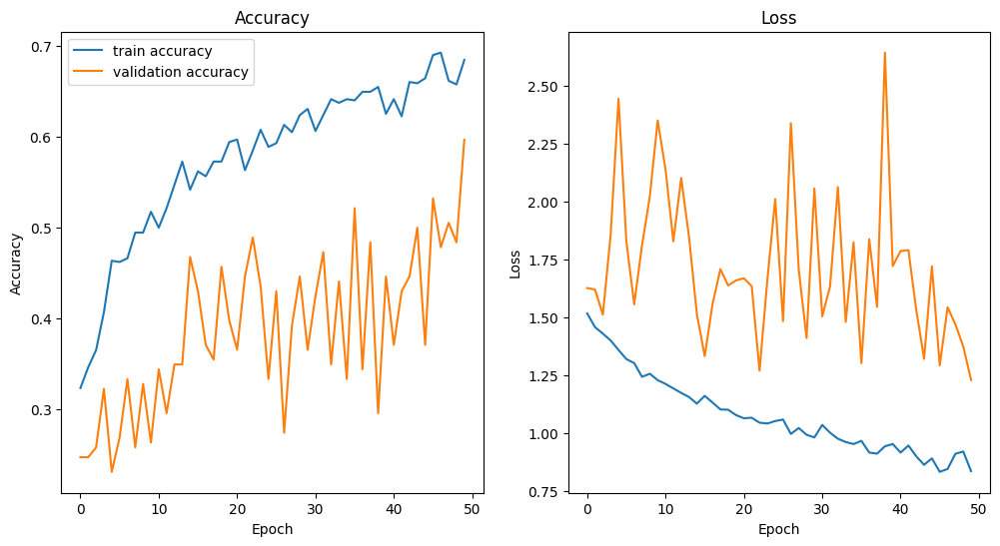

In [68]:
import matplotlib.pyplot as plt

# Supposons que vous avez déjà entraîné votre modèle et obtenu l'historique d'entraînement dans la variable history0.

# Tracer le graphique de l'exactitude
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history0.history['accuracy'], label='train accuracy')
plt.plot(history0.history['val_accuracy'], label='validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Accuracy')
plt.legend()

# Tracer le graphique de la perte
plt.subplot(1, 2, 2)
plt.plot(history0.history['loss'], label='train loss')
plt.plot(history0.history['val_loss'], label='validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss')
plt.legend



In [69]:
test_loss0, test_accuracy0 = best_model0.evaluate(X_test, y_test)
print('Test loss:', test_loss0)
print('Test accuracy:', test_accuracy0)

8/8 [==============================] - 0s 37ms/step - loss: 1.2635 - accuracy: 0.5388
Test loss: 1.2634819746017456
Test accuracy: 0.5387930870056152


In [70]:
# Prediction
y_pred0 = np.argmax(best_model0.predict(X_test), axis=1)

8/8 [==============================] - 1s 40ms/step


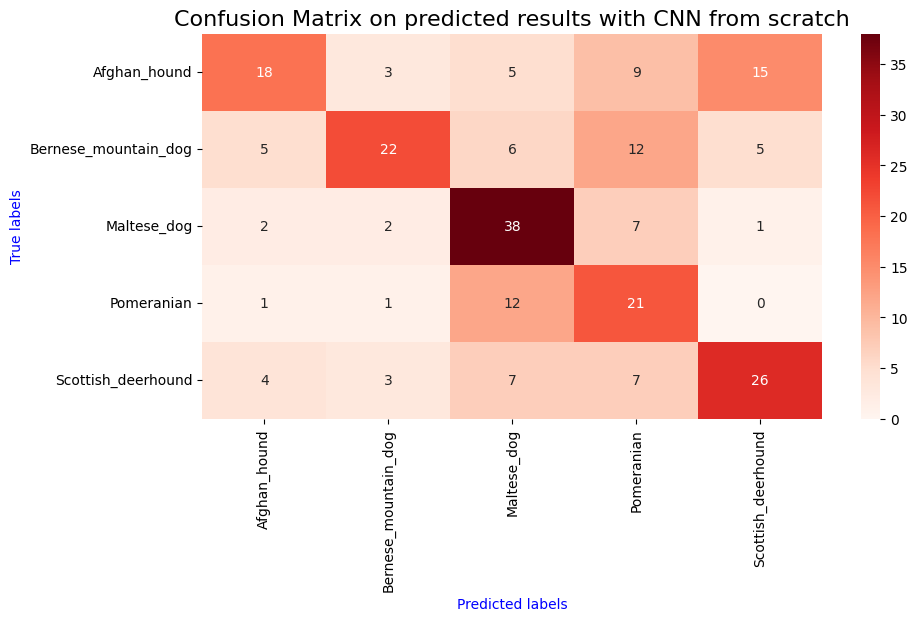

In [71]:

# Confusion Matrix
cf_matrix = confusion_matrix(y_test, y_pred0)

fig = plt.figure(figsize=(10,5))
ax = sns.heatmap(cf_matrix, annot=True, cmap='Reds')
ax.set_xlabel("Predicted labels", color="b")
ax.set_ylabel("True labels", color="b")
ax.xaxis.set_ticklabels(encoder.classes_, 
                        rotation='vertical')
ax.yaxis.set_ticklabels(encoder.classes_,
                        rotation='horizontal')
plt.title("Confusion Matrix on predicted results with CNN from scratch", fontsize=16)
plt.show()

In [117]:
print("Precision Score (weighted) : {:.3f}".format(precision_score(y_test, y_pred0,average='weighted',zero_division=1)))
print("Precision Score (micro) : {:.3f}".format(precision_score(y_test, y_pred0,average='micro',zero_division=1)))

print("Recall Score (weighted) :    {:.3f}".format(recall_score(y_test, y_pred0, average='weighted')))
print("Recall Score (micro) :    {:.3f}".format( recall_score(y_test, y_pred0, average='micro')))

print("F1 score(weighted) :    {:.3f}".format(f1_score(y_test, y_pred0, average='weighted')))
print("F1 score (micro) :    {:.3f}".format( f1_score(y_test, y_pred0, average='micro')))

Precision Score (weighted) : 0.646
Precision Score (micro) : 0.534
Recall Score (weighted) :    0.534
Recall Score (micro) :    0.534
F1 score(weighted) :    0.526
F1 score (micro) :    0.534


## Modèle avec Data augmentation

In [118]:
%%time
tuner = kt.Hyperband(model_builder,
                     objective = 'val_accuracy', 
                     max_epochs = 40,
                     factor = 3,
                     directory = 'Models',
                     project_name = 'hyper_tuning9') 

CPU times: total: 78.1 ms
Wall time: 219 ms


In [119]:
%%time
tuner.search(train_datagen.flow(X_train, y_train, batch_size=16, subset='training'), epochs=40, validation_data=train_datagen.flow(X_train, y_train, batch_size=16, subset='validation'))

Trial 90 Complete [00h 13m 21s]
val_accuracy: 0.37837839126586914

Best val_accuracy So Far: 0.545945942401886
Total elapsed time: 03h 22m 01s
INFO:tensorflow:Oracle triggered exit
CPU times: total: 2h 53min 58s
Wall time: 3h 22min 1s


In [120]:

# Get the optimal hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials = 1)[0]

print(f"""
- The optimal number of filter Convolutional layer : {best_hps.get('num_filters')}
\n - Best activation function : {best_hps.get('dense_activation')}
\n - The optimal learning rate for the optimizer is {best_hps.get('learning_rate')}
\n - Optimal kernel size : {best_hps.get('num_filters')}
\n - Optimal window size : {best_hps.get('window_size')}
""")


- The optimal number of filter Convolutional layer : 8

 - Best activation function : relu

 - The optimal learning rate for the optimizer is 0.0001

 - Optimal kernel size : 8

 - Optimal window size : 3



In [121]:
best_model = tuner.hypermodel.build(best_hps)

In [122]:
%%time
history = best_model.fit( train_datagen.flow(X_train, y_train, batch_size=16, subset='training'),
                     validation_data=train_datagen.flow( X_train, y_train, batch_size=16, subset='validation'),
                     steps_per_epoch=len(X_train)/32, epochs=50)


Epoch 1/50
29/29 [==============================] - 18s 554ms/step - loss: 1.6574 - accuracy: 0.2241 - val_loss: 1.6218 - val_accuracy: 0.1459
Epoch 2/50
29/29 [==============================] - 18s 607ms/step - loss: 1.5629 - accuracy: 0.3275 - val_loss: 1.6278 - val_accuracy: 0.2000
Epoch 3/50
29/29 [==============================] - 35s 1s/step - loss: 1.5513 - accuracy: 0.2953 - val_loss: 1.6497 - val_accuracy: 0.1892
Epoch 4/50
29/29 [==============================] - 35s 1s/step - loss: 1.5341 - accuracy: 0.2888 - val_loss: 1.6854 - val_accuracy: 0.1892
Epoch 5/50
29/29 [==============================] - 35s 1s/step - loss: 1.5445 - accuracy: 0.2967 - val_loss: 1.7340 - val_accuracy: 0.1892
Epoch 6/50
29/29 [==============================] - 35s 1s/step - loss: 1.5080 - accuracy: 0.3253 - val_loss: 1.7886 - val_accuracy: 0.1892
Epoch 7/50
29/29 [==============================] - 35s 1s/step - loss: 1.5097 - accuracy: 0.3233 - val_loss: 1.8502 - val_accuracy: 0.1892
Epoch 8/50
29/

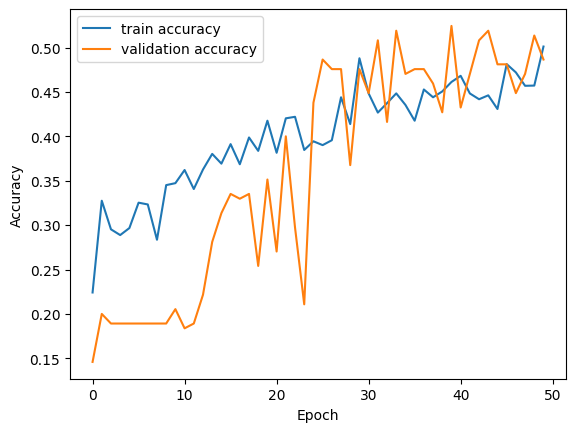

In [123]:
plt.plot(history.history['accuracy'], label='train accuracy')
plt.plot(history.history['val_accuracy'], label='validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [124]:
test_loss, test_accuracy = best_model.evaluate(test_datagen.flow(X_test, y_test,batch_size=16,shuffle=False))
print('Test loss:', test_loss)
print('Test accuracy:', test_accuracy)


15/15 [==============================] - 1s 67ms/step - loss: 1.2506 - accuracy: 0.4784
Test loss: 1.2506111860275269
Test accuracy: 0.4784482717514038


In [125]:
# Prediction
y_pred = np.argmax(best_model.predict(test_datagen.flow(
                    X_test, y_test,batch_size=16,shuffle=False)), axis=1)

15/15 [==============================] - 2s 64ms/step


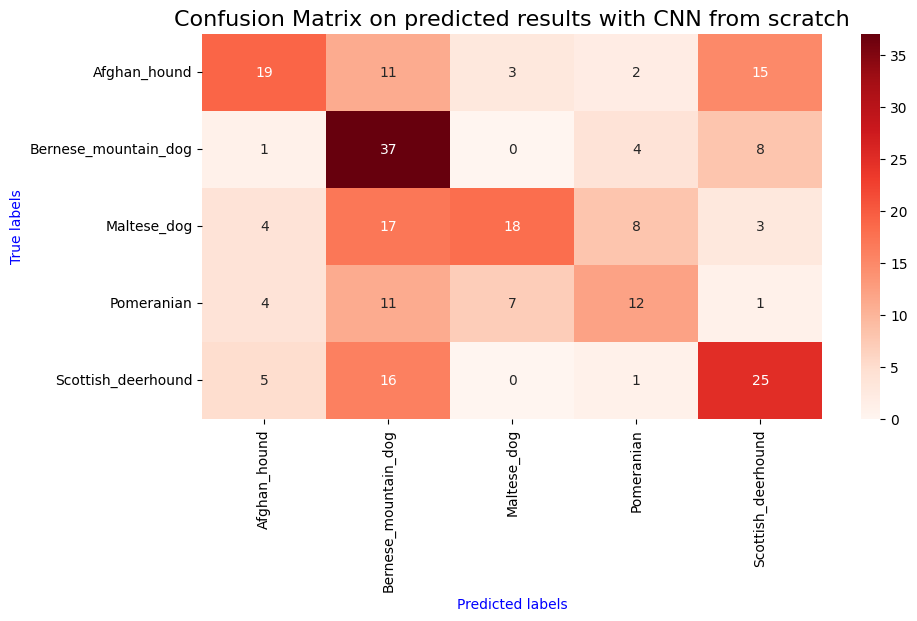

In [126]:
# Confusion Matrix
cf_matrix = confusion_matrix(y_test, y_pred)

fig = plt.figure(figsize=(10,5))
ax = sns.heatmap(cf_matrix, annot=True, cmap='Reds')
ax.set_xlabel("Predicted labels", color="b")
ax.set_ylabel("True labels", color="b")
ax.xaxis.set_ticklabels(encoder.classes_, 
                        rotation='vertical')
ax.yaxis.set_ticklabels(encoder.classes_,
                        rotation='horizontal')
plt.title("Confusion Matrix on predicted results with CNN from scratch", fontsize=16)
plt.show()

In [127]:
print("Precision Score (weighted) : {:.3f}".format(precision_score(y_test, y_pred,average='weighted',zero_division=1)))
print("Precision Score (micro) : {:.3f}".format(precision_score(y_test, y_pred,average='micro',zero_division=1)))

print("Recall Score (weighted) :    {:.3f}".format(recall_score(y_test, y_pred, average='weighted')))
print("Recall Score (micro) :    {:.3f}".format( recall_score(y_test, y_pred, average='micro')))

print("F1 score(weighted) :    {:.3f}".format(f1_score(y_test, y_pred, average='weighted')))
print("F1 score (micro) :    {:.3f}".format( f1_score(y_test, y_pred, average='micro')))

Precision Score (weighted) : 0.514
Precision Score (micro) : 0.478
Recall Score (weighted) :    0.478
Recall Score (micro) :    0.478
F1 score(weighted) :    0.471
F1 score (micro) :    0.478


In [128]:
best_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 300, 300, 8)       608       
                                                                 
 batch_normalization (BatchN  (None, 300, 300, 8)      32        
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 300, 300, 8)       0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 150, 150, 8)      0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 150, 150, 16)      3216      
                                                                 
 batch_normalization_1 (Batc  (None, 150, 150, 16)     6

La fonction ci-dessous est utilisée pour afficher les différentes courbes de l'entraînement du modèle.

## Transfert Learning

The typical transfer-learning workflow
This leads us to how a typical transfer learning workflow can be implemented in Keras:

    1- Instantiate a base model and load pre-trained weights into it.
    2- Freeze all layers in the base model by setting trainable = False.
    3- Create a new model on top of the output of one (or several) layers from the base model.
    4- Train your new model on your new dataset.
Note that an alternative, more lightweight workflow could also be:

    1- Instantiate a base model and load pre-trained weights into it.
    2- Run your new dataset through it and record the output of one (or several) layers from the base model. This is called feature extraction.
    3- Use that output as input data for a new, smaller model.

In [207]:
def preprocess_func(model_name):
   """
   Preprocesses a tensor or Numpy array encoding  for each model
   -------
   param:
   model_name:
   """ 
   if model_name == 'ResNet50':
     preprocessing_function = tf.keras.applications.resnet50.preprocess_input
   elif model_name == 'VGG19':
     preprocessing_function = tf.keras.applications.vgg19.preprocess_input
   elif model_name == 'EfficientNetB3':
     preprocessing_function = tf.keras.applications.efficientnet.preprocess_input
   else:
     preprocessing_function = tf.keras.applications.xception.preprocess_input

   return preprocessing_function  

In [208]:
def TF_CNN(model_name, nb_classes, fine_tune):
  """
   Compiles a model integrated with pretrained layers of model 
   given in parameters of this function
   -------
   param:
   model_name: model name
   nb_classes: integer number of breed
   fine_tune:  integer to define the fine tuning strategy 
  """

  # Import the model pretrained without fully-connected layers
  if model_name == 'ResNet50':
    model = ResNet50(weights="imagenet", include_top=False, input_shape=(224,224,3))
  elif model_name == 'VGG19':
    model = VGG19(weights='imagenet', include_top=False, input_shape=(224,224,3))
  elif model_name == 'EfficientNetB3':
    model = EfficientNetB3(weights='imagenet', include_top=False, input_shape=(300,300,3))
  else:
    model = Xception(weights='imagenet', include_top=False, input_shape=(299,299,3))

  # Defines how many layers to freeze during training.
  # depending on the size of the fine-tuning parameter.

  if fine_tune > 0:
          for layer in model.layers[:-fine_tune]:
            layer.trainable = False
  else:
        for layer in model.layers:
            layer.trainable = False


  #Define tf model with a new fully-connected layers
  tf_model = Sequential()
  tf_model.add(model)
  tf_model.add(GlobalAveragePooling2D())
  tf_model.add(Dense(512, activation='relu'))
  tf_model.add(Dropout(0.2))
  tf_model.add(Dense(nb_classes, activation='softmax'))

  # Compiles the model for training.
  tf_model.compile(optimizer='adam', 
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])
  return tf_model

#### <font id="section_31">  Transfert learning avec extraction des features

In [148]:
#Dataframe to compare models
model_names = ['VGG19', 'ResNet50', 'EfficientNetB3', 'Xception']
dt_compar = pd.DataFrame([], index= model_names, 
                                      columns=['time_of_fit (s)', 'accuracy_train', 'accuracy_val', 'accuracy_test', 'recall_test' ])

Transfert Learning avec 5 races de chiens.

In [177]:
%%time
#Séparation jeux entraînement/test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,shuffle=True, random_state=42)

CPU times: total: 297 ms
Wall time: 2.43 s


In [151]:
X_train.shape

(928, 300, 300, 3)

In [152]:
%%time
import time
result = {}
predict ={}
nb_classes = 5
fine_tune = -1

for model_name in model_names:
  K.clear_session()
  start_time = time.time()
  tf_cnn = TF_CNN(model_name, nb_classes, fine_tune)
  # Data generator on train set with Data Augmentation
  train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function= preprocess_func(model_name))
    #rescale testset
  test_datagen = ImageDataGenerator( preprocessing_function=preprocess_func(model_name))
  # fit model
  result_cnn = tf_cnn.fit(train_datagen.flow(X_train, y_train, batch_size=16, subset='training'),
          validation_data=train_datagen.flow(X_train, y_train, batch_size=16, subset='validation'),
          steps_per_epoch=len(X_train) / 32, epochs=30, verbose=2);
  fit_time = round(time.time() - start_time,1)
  # prediction
  y_pred = np.argmax(tf_cnn.predict(test_datagen.flow(X_test, y_test, batch_size=16,shuffle=False), verbose=1), axis=1)
  #compute and store scores
  dt_compar.loc[model_name, 'time_of_fit (s)'] = fit_time
  dt_compar.loc[model_name, 'accuracy_train'] = result_cnn.history['accuracy'][-1]
  dt_compar.loc[model_name, 'accuracy_val'] = result_cnn.history['val_accuracy'][-1]
  dt_compar.loc[model_name, 'accuracy_test'] = accuracy_score(y_test, y_pred)
  dt_compar.loc[model_name, 'recall_test'] = recall_score(y_test, y_pred, average ='macro')

  # store result
  result[model_name] = result_cnn
  predict[model_name] = y_pred

80134624/80134624 [==============================] - 3s 0us/step
Epoch 1/30
29/29 - 58s - loss: 1.7668 - accuracy: 0.5385 - val_loss: 1.0656 - val_accuracy: 0.7027 - 58s/epoch - 2s/step
Epoch 2/30
29/29 - 8s - loss: 0.9146 - accuracy: 0.7495 - val_loss: 1.0595 - val_accuracy: 0.7243 - 8s/epoch - 291ms/step
Epoch 3/30
29/29 - 9s - loss: 0.6254 - accuracy: 0.7978 - val_loss: 0.5017 - val_accuracy: 0.8324 - 9s/epoch - 296ms/step
Epoch 4/30
29/29 - 8s - loss: 0.4244 - accuracy: 0.8578 - val_loss: 0.3386 - val_accuracy: 0.9027 - 8s/epoch - 288ms/step
Epoch 5/30
29/29 - 8s - loss: 0.4365 - accuracy: 0.8615 - val_loss: 0.4557 - val_accuracy: 0.8703 - 8s/epoch - 287ms/step
Epoch 6/30
29/29 - 8s - loss: 0.3373 - accuracy: 0.8621 - val_loss: 0.5490 - val_accuracy: 0.8216 - 8s/epoch - 292ms/step
Epoch 7/30
29/29 - 8s - loss: 0.3502 - accuracy: 0.8615 - val_loss: 0.4385 - val_accuracy: 0.8541 - 8s/epoch - 293ms/step
Epoch 8/30
29/29 - 9s - loss: 0.3734 - accuracy: 0.8815 - val_loss: 0.6984 - val_a

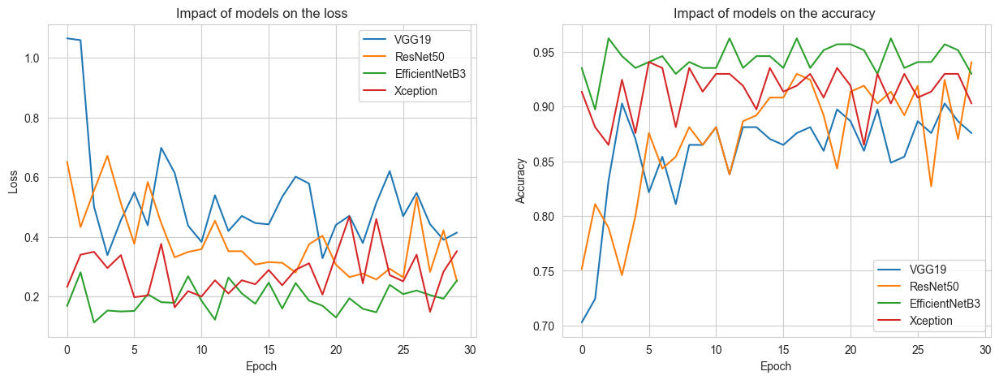

In [155]:
result = result
Columns = model_names
name = 'models'
plot_scores_curves(result, Columns, name)

In [156]:
dt_compar

,time_of_fit (s),accuracy_train,accuracy_val,accuracy_test,recall_test
VGG19,328.1,0.954741,0.875676,0.883621,0.880875
ResNet50,541.2,0.947253,0.940541,0.896552,0.894845
EfficientNetB3,729.3,0.969231,0.92973,0.965517,0.967745
Xception,442.6,0.975824,0.902703,0.948276,0.94952


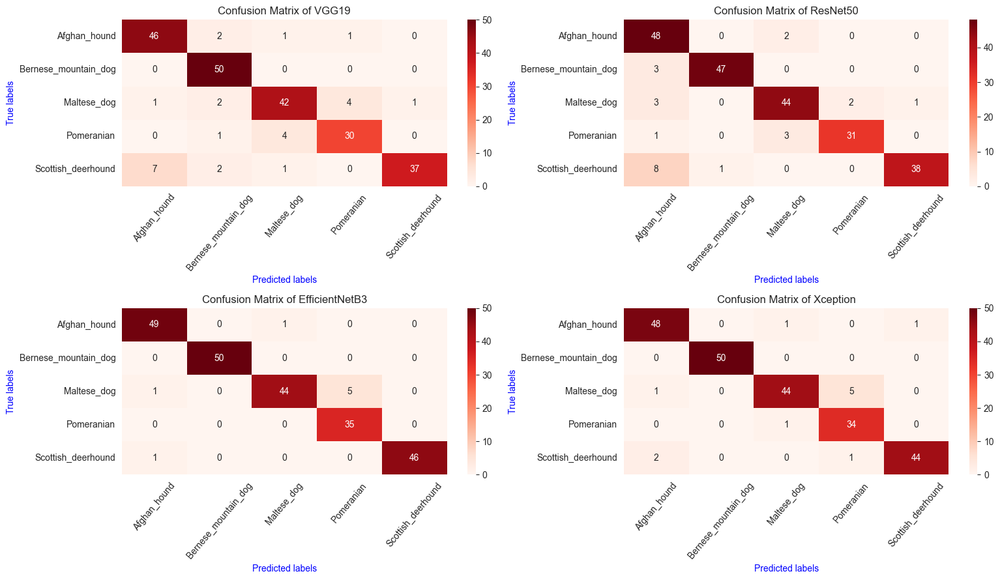

In [180]:
# Liste des noms de modèle
model_names = list(predict.keys())

# Création de la grille de sous-plots 2x2
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(16, 9))
plt.subplots_adjust(hspace=0.5)  # Ajuster l'espace vertical entre les sous-plots

# Boucle pour afficher les matrices de confusion
for i, model_name in enumerate(model_names):
    row = i // 2  # Rangée du subplot
    col = i % 2   # Colonne du subplot

    # Calcul de la matrice de confusion
    cf_matrix = confusion_matrix(y_test, predict[model_name])

    # Créer le heatmap sur le subplot correspondant
    sns.heatmap(cf_matrix, annot=True, cmap='Reds', ax=axes[row, col])
    axes[row, col].set_xlabel("Predicted labels", color="b")
    axes[row, col].set_ylabel("True labels", color="b")
    axes[row, col].xaxis.set_ticklabels(encoder.classes_, rotation=50)
    axes[row, col].yaxis.set_ticklabels(encoder.classes_, rotation='horizontal')
    axes[row, col].set_title(f"Confusion Matrix of {model_name}", fontsize=12)

# Afficher la fenêtre de sous-plots
plt.tight_layout()
plt.show()


#### <font id="section_31"> Transfert learning avec partial fine tuning

In [ ]:
#Dataframe to compare models
model_names = ['EfficientNetB3', 'Xception']
dt_ptf = pd.DataFrame([], index= model_names, 
                                      columns=['time_of_fit (s)', 'accuracy_train', 'accuracy_val', 'accuracy_test', 'recall_test' ])
dt_ptf

In [184]:
%%time
import time
import gc
result = {}
nb_classes = 5
fine_tune = 6
gc.collect();
for model_name in model_names:
  K.clear_session()
  start_time = time.time()
  tf_cnn = TF_CNN(model_name, nb_classes, fine_tune)
  # Data generator on train set with Data Augmentation
  train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function= preprocess_func(model_name))
    #rescale testset
  test_datagen = ImageDataGenerator( preprocessing_function=preprocess_func(model_name))
  
  result_cnn = tf_cnn.fit(train_datagen.flow( X_train, y_train, batch_size=16, subset='training'),
          validation_data=train_datagen.flow(X_train, y_train, batch_size=16, subset='validation'),
          steps_per_epoch=len(X_train) / 32, epochs=10, verbose=2);
  fit_time = round(time.time() - start_time,1)
  # prediction
  y_pred = np.argmax(tf_cnn.predict(test_datagen.flow(X_test, y_test, batch_size=16,shuffle=False), verbose=1), axis=1)
  #compute and store scores
  dt_ptf.loc[model_name, 'time_of_fit (s)'] = fit_time
  dt_ptf.loc[model_name, 'accuracy_train'] = result_cnn.history['accuracy'][-1]
  dt_ptf.loc[model_name, 'accuracy_val'] = result_cnn.history['val_accuracy'][-1]
  dt_ptf.loc[model_name, 'accuracy_test'] = accuracy_score(y_test, y_pred)
  dt_ptf.loc[model_name, 'recall_test'] = recall_score(y_test, y_pred, average ='macro')

  # store result
  result[model_name] = result_cnn

Epoch 1/10
29/29 - 21s - loss: 0.4497 - accuracy: 0.8405 - val_loss: 0.1472 - val_accuracy: 0.9514 - 21s/epoch - 734ms/step
Epoch 2/10
29/29 - 10s - loss: 0.1678 - accuracy: 0.9526 - val_loss: 0.1942 - val_accuracy: 0.9568 - 10s/epoch - 347ms/step
Epoch 3/10
29/29 - 10s - loss: 0.1752 - accuracy: 0.9451 - val_loss: 0.1476 - val_accuracy: 0.9459 - 10s/epoch - 345ms/step
Epoch 4/10
29/29 - 10s - loss: 0.1249 - accuracy: 0.9582 - val_loss: 0.1980 - val_accuracy: 0.9351 - 10s/epoch - 346ms/step
Epoch 5/10
29/29 - 10s - loss: 0.1282 - accuracy: 0.9569 - val_loss: 0.2192 - val_accuracy: 0.9514 - 10s/epoch - 350ms/step
Epoch 6/10
29/29 - 10s - loss: 0.1258 - accuracy: 0.9670 - val_loss: 0.2843 - val_accuracy: 0.9189 - 10s/epoch - 352ms/step
Epoch 7/10
29/29 - 11s - loss: 0.0968 - accuracy: 0.9582 - val_loss: 0.1802 - val_accuracy: 0.9622 - 11s/epoch - 366ms/step
Epoch 8/10
29/29 - 11s - loss: 0.1117 - accuracy: 0.9692 - val_loss: 0.1854 - val_accuracy: 0.9568 - 11s/epoch - 362ms/step
Epoch 9/

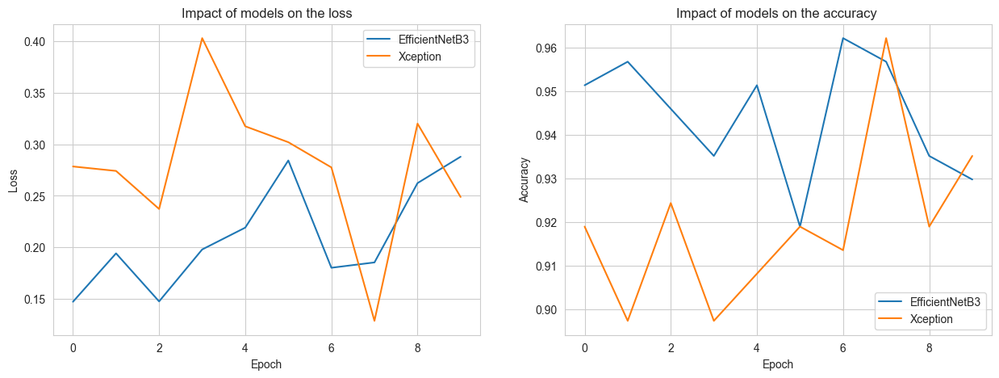

In [185]:
result = result
Columns = model_names
name = 'models'
plot_scores_curves(result, Columns, name)

In [186]:
dt_ptf

,time_of_fit (s),accuracy_train,accuracy_val,accuracy_test,recall_test
EfficientNetB3,121.3,0.967033,0.92973,0.978448,0.979745
Xception,121.2,0.965517,0.935135,0.935345,0.934347


En analysant les deux tableaux de scores, il est évident que la stratégie d'extraction des caractéristiques est plus performante lorsqu'elle est appliquée avec le modèle EfficientNetB3. En revanche, cette stratégie est moins efficace avec le modèle Xception, et son utilisation entraîne une augmentation du temps d'entraînement. Dans les prochaines étapes, nous allons poursuivre la comparaison en évaluant la première stratégie en utilisant 20 races différentes.

#### <font id="section_31"> Transfert learning avec extraction des features avec 20 races

In [210]:
fr_breed_list20 = df_sorted.nlargest(20,'nb_image')['race'] # Liste des 5 races les plus célèbres de France
data_cnn20=image_detail[image_detail['breed_name'].isin(fr_breed_list20)].reset_index()[['image_path','breed_name']]

uri_list20=data_cnn20['image_path'] # liens des différentes photos

label_list20=data_cnn20['breed_name']

In [211]:
data_cnn20['breed_name'].value_counts()

breed_name
Maltese_dog             252
Afghan_hound            239
Scottish_deerhound      232
Pomeranian              219
Irish_wolfhound         218
Bernese_mountain_dog    218
Samoyed                 218
Shih                    214
Great_Pyrenees          213
Leonberg                210
basenji                 209
Tibetan_terrier         206
Sealyham_terrier        202
Airedale                202
EntleBucher             202
Saluki                  200
pug                     200
Lakeland_terrier        197
cairn                   197
Australian_terrier      196
Name: count, dtype: int64

In [212]:
X20 =joblib.load("Variables/X_20_races")

In [213]:


y20 = label_list20
# Convert data in numpy array
y20 = np.array(y20)
#Encode labels
encoder20 = LabelEncoder()
encoder20.fit(y20)
y20 = encoder20.transform(y20)


In [195]:

#joblib.dump(X1, "Variables/X_20_races", compress=True)

['Variables/X_20_races']

In [214]:
#Séparation jeux entraînement/test
X_train, X_test, y_train, y_test = train_test_split(X20, y20, test_size=0.2,shuffle=True, random_state=42)

In [215]:
#Dataframe to compare models
model_names = ['EfficientNetB3', 'Xception']
dt_compar20 = pd.DataFrame([], index= model_names, 
                                      columns=['time_of_fit (s)', 'accuracy_train', 'accuracy_val', 'accuracy_test', 'recall_test' ])

In [ ]:
%%time
import time
result = {}
predict ={}
nb_classes = 20
fine_tune = -1

for model_name in model_names:
  gc.collect();
  K.clear_session()
  start_time = time.time()
  tf_cnn = TF_CNN(model_name, nb_classes, fine_tune)
  # Data generator on train set with Data Augmentation
  train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function= preprocess_func(model_name))
    #rescale testset
  test_datagen = ImageDataGenerator( preprocessing_function=preprocess_func(model_name))
  
  result_cnn = tf_cnn.fit(train_datagen.flow( X_train, y_train, batch_size=16, subset='training'),
          validation_data=train_datagen.flow(X_train, y_train, batch_size=16, subset='validation'),
          steps_per_epoch=len(X_train) / 32, epochs=30, verbose=2);
  fit_time = round(time.time() - start_time,1)
  # prediction
  y_pred = np.argmax(tf_cnn.predict(test_datagen.flow(X_test, y_test, batch_size=16,shuffle=False), verbose=1), axis=1)
  #compute and store scores
  dt_compar20.loc[model_name, 'time_of_fit (s)'] = fit_time
  dt_compar20.loc[model_name, 'accuracy_train'] = result_cnn.history['accuracy'][-1]
  dt_compar20.loc[model_name, 'accuracy_val'] = result_cnn.history['val_accuracy'][-1]
  dt_compar20.loc[model_name, 'accuracy_test'] = accuracy_score(y_test, y_pred)
  dt_compar20.loc[model_name, 'recall_test'] = recall_score(y_test, y_pred, average ='macro')

  # store result
  result[model_name] = result_cnn
  predict[model_name] = y_pred

In [ ]:
dt_compar20

,time_of_fit (s),accuracy_train,accuracy_val,accuracy_test,recall_test
EfficientNetB3,1029.1,0.924473,0.774669,0.850412,0.861412
Xception,1024.1,0.871495,0.759941,0.832744,0.84159


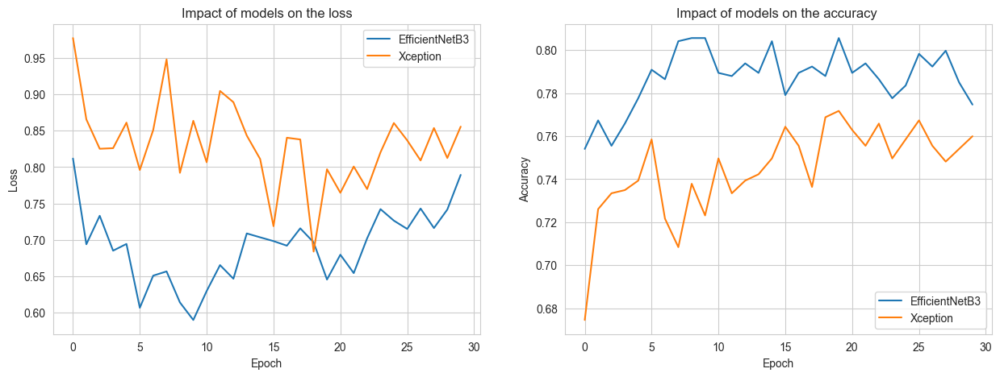

In [ ]:
result = result
Columns = ['EfficientNetB3', 'Xception']
name = 'models'
plot_scores_curves(result, Columns, name)

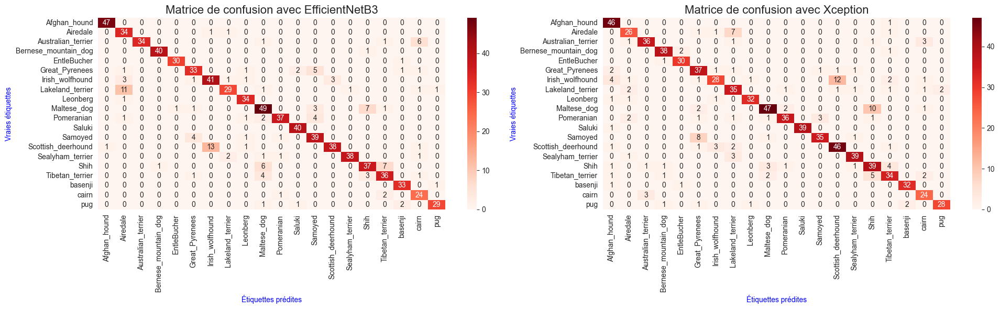

In [ ]:
# Noms des modèles
model_names = ['EfficientNetB3', 'Xception']

# Affichage des matrices de confusion côte à côte
plt.figure(figsize=(20, 6))

for idx, model_name in enumerate(model_names):
    plt.subplot(1, 2, idx+1)
    cf_matrix = confusion_matrix(y_test, predict[model_name])
    ax = sns.heatmap(cf_matrix, annot=True, cmap='Reds')
    ax.set_xlabel("Étiquettes prédites", color="b")
    ax.set_ylabel("Vraies étiquettes", color="b")
    ax.set_title(f"Matrice de confusion avec {model_name}", fontsize=16)
    ax.xaxis.set_ticklabels(encoder20.classes_, rotation=90)
    ax.yaxis.set_ticklabels(encoder20.classes_, rotation=0)

plt.tight_layout()
plt.show()

### <font id="section_4"> Modèle finale sur toute la base de données

Nous allons segmenter les images de notre ensemble de données en différents groupes (train, validation, test), puis les stocker dans des sous-répertoires correspondants au répertoire de sortie. Cette approche nous permettra ultérieurement d'utiliser des générateurs de données pour charger et prétraiter ces groupes d'images, facilitant ainsi leur utilisation lors de la phase d'entraînement de votre modèle.

In [209]:
import splitfolders
input_folder = "Images"
splitfolders.ratio(input_folder, output="Images_V1",seed = 42, ratio=(0.75, 0.15,0.1), group_prefix=None)

In [210]:
# Chemins vers les répertoires de données
train_data_dir = "Images_V1/train"
validation_data_dir = "Images_V1/val"
test_data_dir = "Images_V1/test"

# Paramètres d'entraînement
epochs = 20
batch_size = 50
fine_tune = -1
nb_classes = 120
img_width = 300
img_height = 300
model_name = "EfficientNetB3"

In [211]:
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    preprocessing_function = preprocess_func(model_name))
    #rescale testset
test_datagen = ImageDataGenerator(preprocessing_function=preprocess_func(model_name))

Nous allons préparer les images de test ainsi que leurs classes associées de manière à les rendre conforme avec le modèle entraîné, ce qui nous permettra d'effectuer des prédictions précises et cohérentes

In [212]:
%%time
#prepare test dataset for prediction
X_test =[]
test_class = []
path_test = "Images_V1/test"
breed_id = os.listdir(path_test)
for classe in breed_id:
    images = os.listdir(path_test + "/" + classe)
    for i in range(len(images)):
        # read image for each path from datatest directory
        image = cv2.imread(path_test+"/"+ classe +"/"+images[i])
        # resize image
        image = cv2.resize(image, (img_width,img_height))
        X_test.append(image)
        # store the corresponding breed of each image
        test_class.append(classe)

## Convert  to np array
X_test = np.array(X_test)
y_test = np.array(test_class) 
#Encode labels
encoder = LabelEncoder()
encoder.fit(y_test)
y_test = encoder.transform(y_test) 

CPU times: total: 2.05 s
Wall time: 14.9 s


Le train_generator que vous avez créé à l'aide de flow_from_directory ne nécessite pas explicitement de spécifier y_train car il génère les étiquettes (labels) automatiquement à partir de la structure des répertoires que vous avez fournie. Lorsque vous organisez vos données d'entraînement dans des répertoires avec des sous-répertoires correspondant à chaque classe, le générateur de données associe automatiquement les images à leurs étiquettes en fonction du nom du repertoire dans lequel se trouve l'image.

Autrement dit lorsqu'on  utilise un générateur de données comme flow_from_directory dans TensorFlow ou Keras, les noms des sous-répertoires dans le répertoire principal sont utilisés comme étiquettes (classes) pour les images qu'ils contiennent. Cela permet de gérer facilement les ensembles de données organisés par classe.

In [154]:
%%time
Tf_effecientnetb3 = tf_cnn = TF_CNN("EfficientNetB3", nb_classes , fine_tune)

train_generator = train_datagen.flow_from_directory(
    train_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode="sparse")
  
validation_generator = train_datagen.flow_from_directory(
    validation_data_dir,
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode="sparse")
  
history_effnet = Tf_effecientnetb3.fit( train_generator, epochs=10, validation_data=validation_generator)

Found 15394 images belonging to 120 classes.
Found 3025 images belonging to 120 classes.
Epoch 1/10
308/308 [==============================] - 285s 900ms/step - loss: 0.9926 - accuracy: 0.7561 - val_loss: 0.4746 - val_accuracy: 0.8536
Epoch 2/10
308/308 [==============================] - 271s 881ms/step - loss: 0.4734 - accuracy: 0.8518 - val_loss: 0.4680 - val_accuracy: 0.8602
Epoch 3/10
308/308 [==============================] - 249s 807ms/step - loss: 0.4004 - accuracy: 0.8711 - val_loss: 0.4661 - val_accuracy: 0.8588
Epoch 4/10
308/308 [==============================] - 248s 805ms/step - loss: 0.3563 - accuracy: 0.8806 - val_loss: 0.4563 - val_accuracy: 0.8572
Epoch 5/10
308/308 [==============================] - 247s 803ms/step - loss: 0.3248 - accuracy: 0.8949 - val_loss: 0.4623 - val_accuracy: 0.8638
Epoch 6/10
308/308 [==============================] - 249s 807ms/step - loss: 0.2983 - accuracy: 0.8974 - val_loss: 0.4315 - val_accuracy: 0.8674
Epoch 7/10
308/308 [===============

In [216]:
Xception.save('Models/Xception_model.h5')
print("Xception_model saved")

Xception_model saved


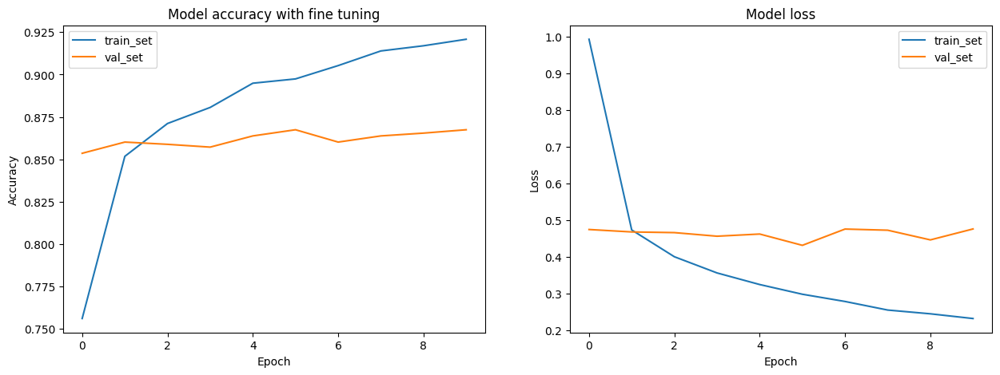

In [165]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5))
# summarize history for accuracy
ax[0].plot(history_effnet.history['accuracy'])
ax[0].plot(history_effnet.history['val_accuracy'])
ax[0].set_title('Model accuracy with fine tuning')
ax[0].set_xlabel('Epoch')
ax[0].set_ylabel('Accuracy')
ax[0].legend(['train_set','val_set'])

# summarize history for loss
ax[1].plot(history_effnet.history['loss'])
ax[1].plot(history_effnet.history['val_loss'])
ax[1].set_title('Model loss')
ax[1].set_xlabel('Epoch')
ax[1].set_ylabel('Loss')
ax[1].legend(['train_set','val_set'])

plt.show()

In [167]:
y_pred = np.argmax(Tf_effecientnetb3.predict(test_datagen.flow(X_test, y_test, batch_size=16,shuffle=False), verbose=1), axis=1)

136/136 [==============================] - 12s 75ms/step


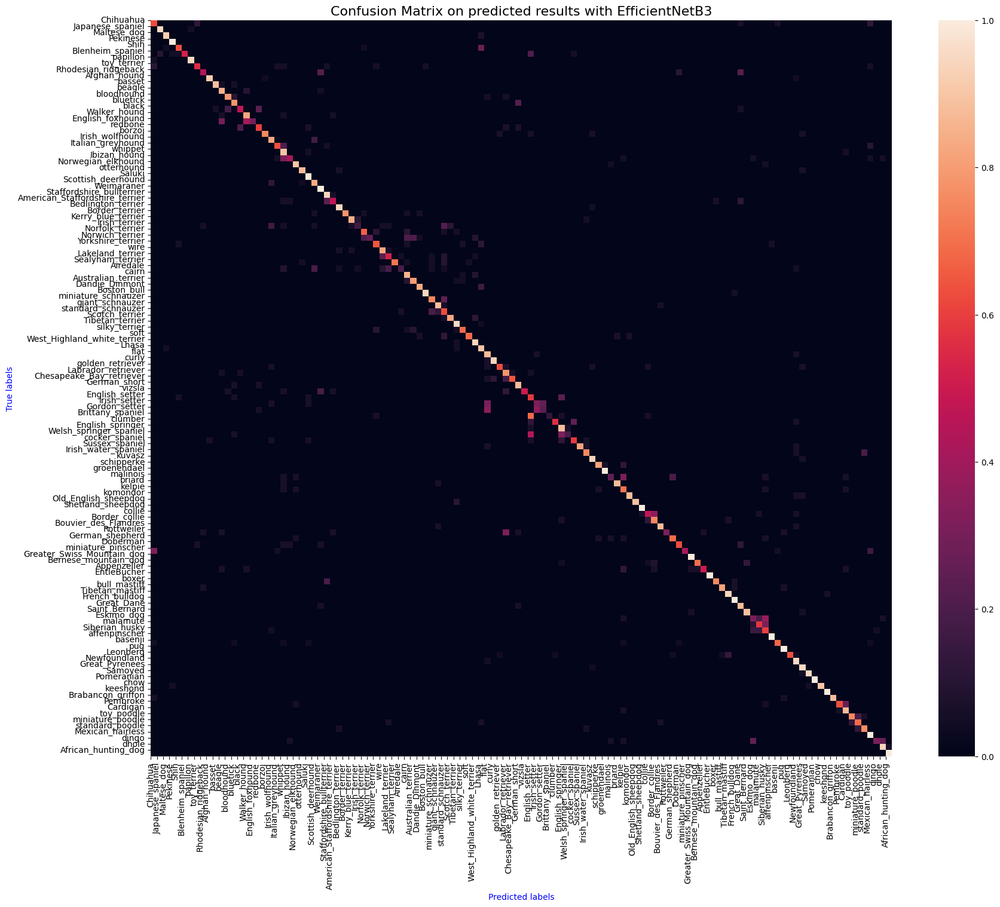

In [169]:
breeds = []
for classe in encoder.classes_:
    breeds.append(classe.split('-')[1])

cf_matrix = confusion_matrix(y_test, y_pred, normalize='true')

fig, ax = plt.subplots(figsize=(20, 16))
sns.heatmap(cf_matrix, annot=False, ax=ax)  # Vous pouvez choisir d'afficher les annotations (valeurs) si nécessaire
ax.set_xlabel("Predicted labels", color="b")
ax.set_ylabel("True labels", color="b")
ax.set_xticks(np.arange(len(breeds)))  # Réglage des emplacements des ticks sur l'axe x
ax.set_yticks(np.arange(len(breeds)))  # Réglage des emplacements des ticks sur l'axe y
ax.set_xticklabels(breeds, rotation=90)  # Affectation des étiquettes de ticks pour l'axe x
ax.set_yticklabels(breeds, rotation=0)   # Affectation des étiquettes de ticks pour l'axe y
plt.title("Confusion Matrix on predicted results with EfficientNetB3", fontsize=16)
plt.show()


In [170]:
print("Precision Score (macro) : {:.3f}".format(precision_score(y_test, y_pred,average='macro',zero_division=1)))
print("Precision Score (micro) : {:.3f}".format(precision_score(y_test, y_pred,average='micro',zero_division=1)))

print("Recall Score (macro) :    {:.3f}".format(recall_score(y_test, y_pred, average='macro')))
print("Recall Score (micro) :    {:.3f}".format( recall_score(y_test, y_pred, average='micro')))

Precision Score (macro) : 0.774
Precision Score (micro) : 0.742
Recall Score (macro) :    0.737
Recall Score (micro) :    0.742



Les éléments diagonaux de la matrice de confusion présentent des valeurs significativement supérieures à 0,5, indiquant ainsi que la majorité des catégories sont prédites avec précision. En revanche, les prédictions erronées, qui sont rares, se situent en dehors de la diagonale. Il y a seulement un ou deux éléments en dehors de la diagonale qui affichent des valeurs supérieures à 0,5, ce qui est clairement visible grâce à la variation de couleur par rapport au noir, qui représente la valeur 0. En somme, les erreurs de prédiction se concentrent principalement sur une ou deux catégories de races spécifiques, tandis que la plupart des races sont prédites avec une bonne exactitude.

In [192]:
import pandas as pd

worst_predicted_indices = cf_matrix.diagonal().argsort()[:10]

data = []

for n, i in enumerate(worst_predicted_indices):
    if cf_matrix[i, i] < 0.5:
        race = np.sort(breeds)[i]
        percentage = cf_matrix[i, i]
        
        often_confused_indices = cf_matrix[i].argsort()[-1:-4:-1]
        
        confused_races = []
        for j in often_confused_indices:
            if j != i:
                confused_races.append(f'{np.sort(breeds)[j]} (P={cf_matrix[i, j]:.2f})')
        
        confused_races_str = ' / '.join(confused_races)
        data.append([race, percentage, confused_races_str])

df = pd.DataFrame(data, columns=['Race', 'Proportion', 'Prédiction du modèle'])
df


,Race,Proportion,Prédiction du modèle
0,Siberian_husky,0.125000,Sealyham_terrier (P=0.69) / Irish_wolfhound (P...
1,Irish_setter,0.166667,Norfolk_terrier (P=0.22) / Doberman (P=0.17)
2,Tibetan_mastiff,0.187500,Sealyham_terrier (P=0.44) / Sussex_spaniel (P=...
3,Labrador_retriever,0.190476,German_shepherd (P=0.19) / Japanese_spaniel (P...
4,Shih,0.235294,Shetland_sheepdog (P=0.35) / Rhodesian_ridgeba...
5,affenpinscher,0.250000,basset (P=0.31) / bull_mastiff (P=0.19)
6,Irish_water_spaniel,0.250000,Irish_terrier (P=0.20) / Lakeland_terrier (P=0...
7,Chesapeake_Bay_retriever,0.294118,Cardigan (P=0.41) / Boston_bull (P=0.29)
8,vizsla,0.312500,whippet (P=0.25) / keeshond (P=0.25)
9,Shetland_sheepdog,0.312500,Rhodesian_ridgeback (P=0.31) / Shih (P=0.25)


In [175]:
import pandas as pd
breedset = [classe.split('-')[1] for classe in encoder.classes_]
breed_list = pd.DataFrame({'breed_name': breedset})
breed_list.to_csv('classes.csv', index=False)


Visualisation de quelques prédictions

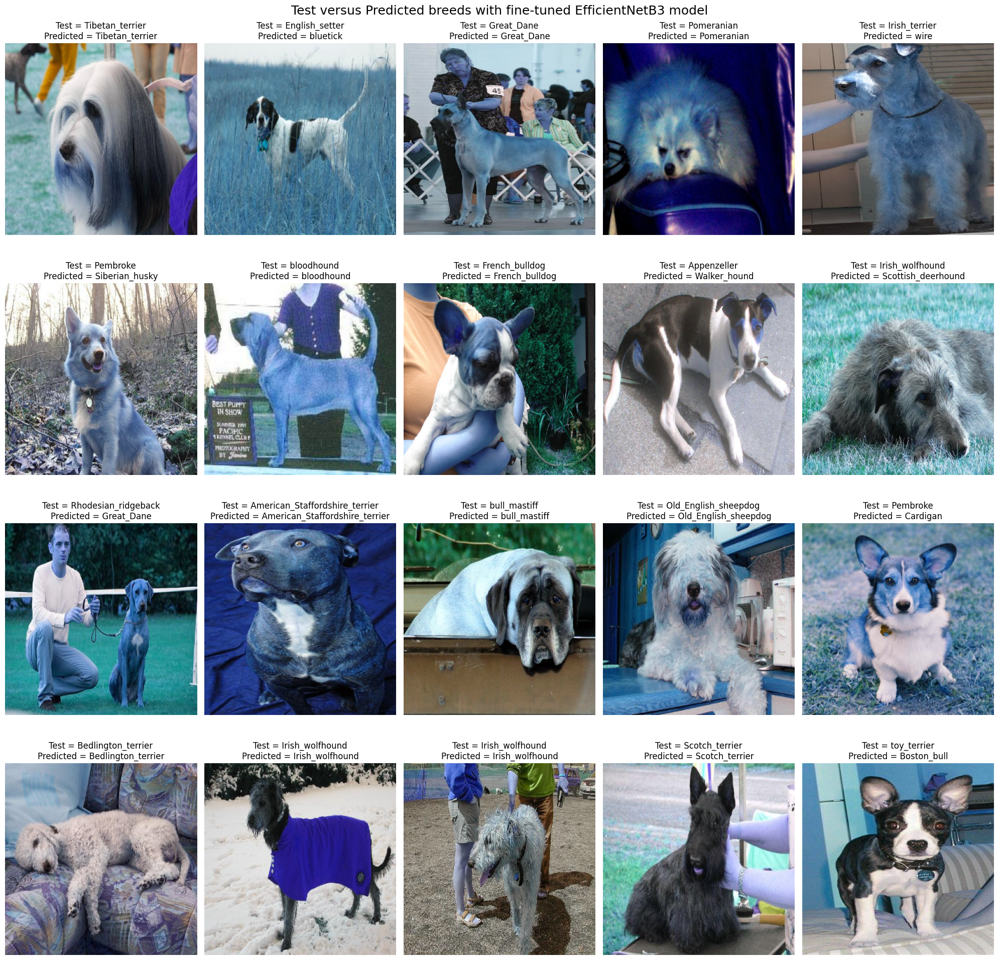

In [179]:
# Inverse transform of encoding
cl_pred = [pred.split('-')[1] for pred in encoder.inverse_transform(y_pred)]
cl_test = [test.split('-')[1] for test in encoder.inverse_transform(y_test)]

# Génération d'une figure avec plusieurs sous-graphiques
fig, axes = plt.subplots(4, 5, figsize=(20, 20))
plt.suptitle("Test versus Predicted breeds with fine-tuned EfficientNetB3 model", fontsize=18)

for ax in axes.ravel():
    m = np.random.randint(0, len(X_test))  # Sélection aléatoire d'un échantillon
    ax.imshow(X_test[m])
    ax.set_title(f'Test = {cl_test[m]}\nPredicted = {cl_pred[m]}')
    ax.axis('off')  # Désactiver les axes

plt.tight_layout()
plt.show()
